In [1]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets

In [2]:
import nibabel as nib
import numpy as np
import os
import gzip

surf_dir = '/home/yujun/miniconda3/envs/pycortex/share/pycortex/db/fsaverage/surfaces'
nilearn_dir = os.path.expanduser('~/nilearn_data/fsaverage')

if not os.path.exists(nilearn_dir):
    from nilearn import datasets
    datasets.fetch_surf_fsaverage('fsaverage')

for hemi, side in [('lh', 'left'), ('rh', 'right')]:
    gii_path = os.path.join(nilearn_dir, f'flat_{side}.gii.gz')
    out_path = os.path.join(surf_dir, f'flat_{hemi}.gii')
    with gzip.open(gii_path, 'rb') as f:
        gii = nib.GiftiImage.from_bytes(f.read())
    nib.save(gii, out_path)
    print(f'Saved {out_path}')

Saved /home/yujun/miniconda3/envs/pycortex/share/pycortex/db/fsaverage/surfaces/flat_lh.gii
Saved /home/yujun/miniconda3/envs/pycortex/share/pycortex/db/fsaverage/surfaces/flat_rh.gii


In [3]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets

cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"

fsaverage_ni = datasets.fetch_surf_fsaverage('fsaverage')
texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)
texture = np.hstack([texture_l, texture_r])

vertex_data = cortex.Vertex(texture, 'fsaverage', cmap='hot', vmin=0, vmax=texture.max())

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage


In [4]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets

cortex.database.db = cortex.database.Database()

# First, let's add ROIs from FreeSurfer's aparc atlas to pycortex
# Load the annotation files
fs_subj = '/usr/local/freesurfer/7.4.1/subjects/fsaverage'

for hemi in ['lh', 'rh']:
    annot_path = f'{fs_subj}/label/{hemi}.aparc.annot'
    labels, ctab, names = nib.freesurfer.read_annot(annot_path)
    names = [n.decode() if isinstance(n, bytes) else n for n in names]
    print(f"{hemi}: {names[:10]}...")

# Add specific ROIs we care about using vertex indices from the atlas
# We'll use the Kastner atlas or manually define visual ROIs
# For now, let's use cortex.utils.add_roi via the web viewer

# First let's just plot with the aparc ROIs
# We need to create an overlays.svg - let's use cortex's auto-generation
cortex.utils.add_roi(cortex.Vertex(np.zeros(cortex.db.get_surf('fsaverage', 'fiducial', 'lh')[0].shape[0] + 
                                              cortex.db.get_surf('fsaverage', 'fiducial', 'rh')[0].shape[0]), 
                                    'fsaverage'), 
                      name='test', open_inkscape=False)

lh: ['unknown', 'bankssts', 'caudalanteriorcingulate', 'caudalmiddlefrontal', 'corpuscallosum', 'cuneus', 'entorhinal', 'fusiform', 'inferiorparietal', 'inferiortemporal']...
rh: ['unknown', 'bankssts', 'caudalanteriorcingulate', 'caudalmiddlefrontal', 'corpuscallosum', 'cuneus', 'entorhinal', 'fusiform', 'inferiorparietal', 'inferiortemporal']...


FFA: 9375 vertices
PPA: 3580 vertices
EBA: 12342 vertices
V1: 3735 vertices
RSC: 4919 vertices
[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage
Failed to get connection
** (org.inkscape.Inkscape:14723): CRITICAL **: 00:47:38.081: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (org.inkscape.Inkscape:14723): CRITICAL **: 00:47:38.081: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (org.inkscape.Inkscape:14723): CRITICAL **: 00:47:38.081: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Background RRGGBBAA: ffffff00
Area 0:0:2274.66:1024 exported to 2275 x 1024 pixels (96 dpi)


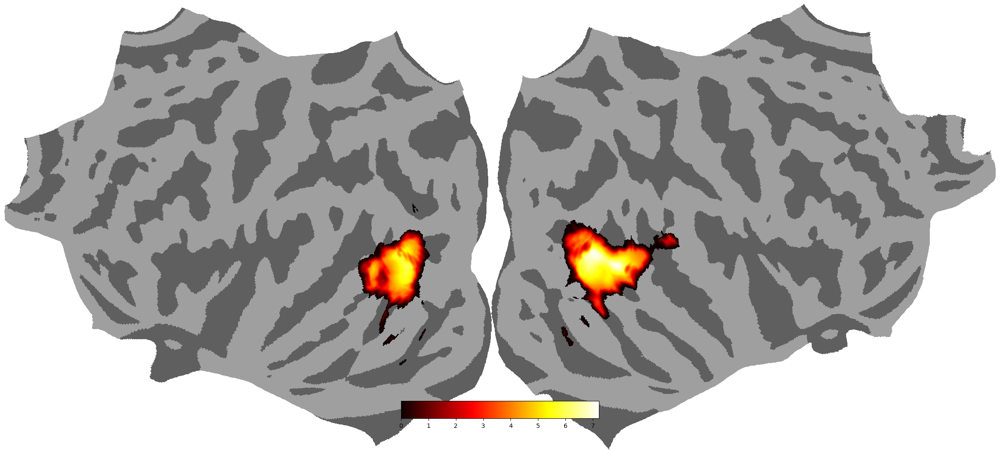

In [5]:
import cortex
import cortex.database
import cortex.utils
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets
import os

cortex.database.db = cortex.database.Database()

# Load FreeSurfer aparc annotation to get visual area ROIs
fs_subj = '/usr/local/freesurfer/7.4.1/subjects/fsaverage'
n_lh = cortex.db.get_surf('fsaverage', 'fiducial', 'lh')[0].shape[0]
n_rh = cortex.db.get_surf('fsaverage', 'fiducial', 'rh')[0].shape[0]
n_verts = n_lh + n_rh

# Read annotations
labels_lh, ctab_lh, names_lh = nib.freesurfer.read_annot(f'{fs_subj}/label/lh.aparc.annot')
labels_rh, ctab_rh, names_rh = nib.freesurfer.read_annot(f'{fs_subj}/label/rh.aparc.annot')
names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

# Map ROI names we want to aparc regions
# These are approximate mappings:
roi_map = {
    'FFA': 'fusiform',           # fusiform face area ~ fusiform gyrus
    'PPA': 'parahippocampal',    # parahippocampal place area
    'EBA': 'lateraloccipital',   # extrastriate body area ~ lateral occipital
    'V1': 'pericalcarine',       # early visual ~ pericalcarine
    'RSC': 'isthmuscingulate',   # retrosplenial cortex
}

# Create vertex ROI dict
roi_verts = {}
for roi_name, aparc_name in roi_map.items():
    verts = []
    if aparc_name in names_lh:
        idx = names_lh.index(aparc_name)
        verts.extend(np.where(labels_lh == idx)[0].tolist())
    if aparc_name in names_rh:
        idx = names_rh.index(aparc_name)
        verts.extend((np.where(labels_rh == idx)[0] + n_lh).tolist())
    roi_verts[roi_name] = np.array(verts)
    print(f"{roi_name}: {len(verts)} vertices")

# Add ROIs to pycortex
cortex.utils.add_roi(cortex.Vertex(np.zeros(n_verts), 'fsaverage'), 
                      name='temp', open_inkscape=False)

# Now plot
tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"
fsaverage_ni = datasets.fetch_surf_fsaverage('fsaverage')
texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)
texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < 0.01] = np.nan

vertex_data = cortex.Vertex(texture, 'fsaverage', cmap='hot', vmin=0, vmax=np.nanmax(texture))

fig = cortex.quickflat.make_figure(vertex_data, 
                                    with_curvature=True, 
                                    with_colorbar=True,
                                    with_rois=True,
                                    with_sulci=False,
                                    with_labels=True,
                                    curvature_brightness=0.5,
                                    curvature_contrast=0.25)
fig.savefig('/tmp/tmap_flatmap_rois.png', dpi=300, bbox_inches='tight')
plt.show()

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage
Added FFA
Added PPA
Added EBA
Added V1
Added RSC


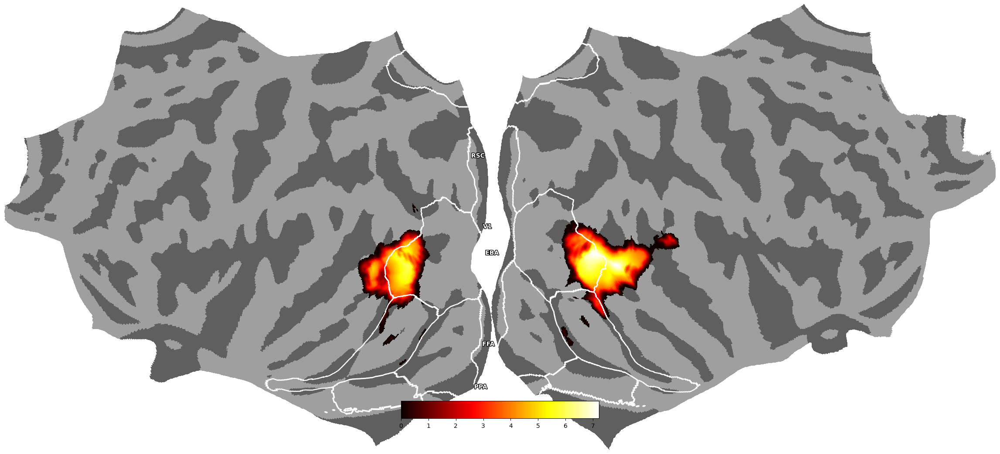

Done!


In [4]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe

cortex.database.db = cortex.database.Database()

# Load tmap
tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"
fsaverage_ni = datasets.fetch_surf_fsaverage('fsaverage')
texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)
texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < 0.01] = np.nan

vertex_data = cortex.Vertex(texture, 'fsaverage', cmap='hot', vmin=0, vmax=np.nanmax(texture))

fig = cortex.quickflat.make_figure(vertex_data, 
                                    with_curvature=True, 
                                    with_colorbar=True,
                                    with_rois=False,
                                    with_sulci=False,
                                    with_labels=False,
                                    curvature_brightness=0.5,
                                    curvature_contrast=0.25,
                                    height=1024)

# Now add ROI outlines manually
# Get flat surface coordinates
flat_pts, flat_polys = cortex.db.get_surf('fsaverage', 'flat', merge=True, nudge=True)
n_lh = cortex.db.get_surf('fsaverage', 'flat', 'lh')[0].shape[0]

# Load aparc annotations
fs_subj = '/usr/local/freesurfer/7.4.1/subjects/fsaverage'
labels_lh, _, names_lh = nib.freesurfer.read_annot(f'{fs_subj}/label/lh.aparc.annot')
labels_rh, _, names_rh = nib.freesurfer.read_annot(f'{fs_subj}/label/rh.aparc.annot')
names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

# Combine labels
labels_all = np.hstack([labels_lh, labels_rh])
# For right hemisphere, offset label indices to distinguish from left
# Actually names are the same, so just use vertex indices

roi_map = {
    'FFA': 'fusiform',
    'PPA': 'parahippocampal', 
    'EBA': 'lateraloccipital',
    'V1': 'pericalcarine',
    'RSC': 'isthmuscingulate',
}

ax = fig.axes[0]

for roi_name, aparc_name in roi_map.items():
    # Get vertices for this ROI (both hemispheres)
    mask = np.zeros(len(labels_all), dtype=bool)
    
    if aparc_name in names_lh:
        idx = names_lh.index(aparc_name)
        mask[:n_lh] = (labels_lh == idx)
    if aparc_name in names_rh:
        idx = names_rh.index(aparc_name)
        mask[n_lh:] = (labels_rh == idx)
    
    if mask.sum() == 0:
        continue
    
    # Find boundary edges: edges where one vertex is in ROI and other isn't
    boundary_lines = []
    for tri in flat_polys:
        in_roi = mask[tri]
        if in_roi.sum() > 0 and in_roi.sum() < 3:  # boundary triangle
            for i in range(3):
                v1, v2 = tri[i], tri[(i+1)%3]
                if mask[v1] != mask[v2]:
                    boundary_lines.append([flat_pts[v1, :2], flat_pts[v2, :2]])
    
    if boundary_lines:
        lc = LineCollection(boundary_lines, colors='white', linewidths=1.5, alpha=0.9)
        ax.add_collection(lc)
        
        # Add label at centroid of ROI vertices
        roi_pts = flat_pts[mask]
        cx, cy = roi_pts[:, 0].mean(), roi_pts[:, 1].mean()
        ax.text(cx, cy, roi_name, color='white', fontsize=10, fontweight='bold',
                ha='center', va='center',
                path_effects=[pe.withStroke(linewidth=2, foreground='black')])
        print(f"Added {roi_name}")

fig.savefig('/tmp/tmap_flatmap_rois.png', dpi=300, bbox_inches='tight')
plt.show()
print("Done!")

# fsaverage-anat

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage
  Added Lateral Occipital (12342 vertices)
  Added Fusiform (9375 vertices)
  Added Inferior Temporal (8613 vertices)
  Added Banks STS (4333 vertices)
  Added Superior Temporal (14139 vertices)
  Added Middle Temporal (9509 vertices)
  Added Inferior Parietal (17547 vertices)
  Added Supramarginal (16750 vertices)


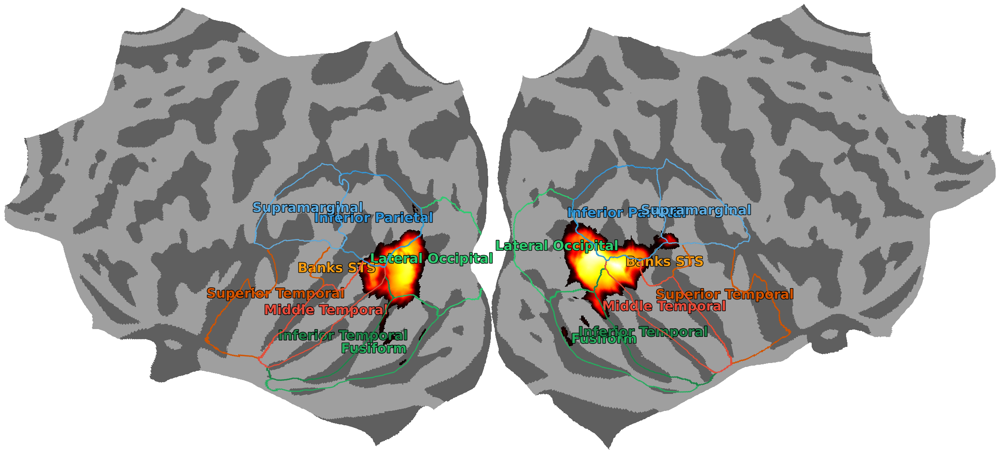

Done!


In [37]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

cortex.database.db = cortex.database.Database()

# Load tmap
tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"
fsaverage_ni = datasets.fetch_surf_fsaverage('fsaverage')
texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)
texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < 0.01] = np.nan

vertex_data = cortex.Vertex(texture, 'fsaverage', cmap='hot', vmin=0, vmax=np.nanmax(texture))

fig = cortex.quickflat.make_figure(vertex_data,
                                    with_curvature=True,
                                    with_colorbar=False,
                                    with_rois=False,
                                    with_sulci=False,
                                    with_labels=False,
                                    curvature_brightness=0.5,
                                    curvature_contrast=0.25,
                                    height=1024)

# Get flat surface coordinates
flat_pts, flat_polys = cortex.db.get_surf('fsaverage', 'flat', merge=True, nudge=True)
n_lh = cortex.db.get_surf('fsaverage', 'flat', 'lh')[0].shape[0]

# Load aparc annotations
fs_subj = '/usr/local/freesurfer/7.4.1/subjects/fsaverage'
labels_lh, _, names_lh = nib.freesurfer.read_annot(f'{fs_subj}/label/lh.aparc.annot')
labels_rh, _, names_rh = nib.freesurfer.read_annot(f'{fs_subj}/label/rh.aparc.annot')
names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

# ROIs with original aparc names and category-grouped colors
roi_map = {
    # Early visual
    # 'pericalcarine':      {'color': '#9B59B6', 'category': 'Early visual',      'label': 'Pericalcarine'},
    # 'cuneus':             {'color': '#8E44AD', 'category': 'Early visual',      'label': 'Cuneus'},
    # 'lingual':            {'color': '#BB8FCE', 'category': 'Early visual',      'label': 'Lingual'},
  
    # Ventral temporal / object-scene
    'lateraloccipital':   {'color': '#2ecc71', 'category': 'Ventral/lateral',   'label': 'Lateral Occipital'},
    'fusiform':           {'color': '#27AE60', 'category': 'Ventral/lateral',   'label': 'Fusiform'},
    # 'parahippocampal':    {'color': '#76D7C4', 'category': 'Ventral/lateral',   'label': 'Parahippocampal'},
    'inferiortemporal':   {'color': '#1E8449', 'category': 'Ventral/lateral',   'label': 'Inferior Temporal'},

    # Temporal
    'bankssts':           {'color': '#F39C12', 'category': 'Temporal',          'label': 'Banks STS'},
    'superiortemporal':   {'color': '#D35400', 'category': 'Temporal',          'label': 'Superior Temporal'},
    'middletemporal':     {'color': '#E74C3C', 'category': 'Temporal',          'label': 'Middle Temporal'},

    # Parietal
    # 'superiorparietal':   {'color': '#85C1E9', 'category': 'Parietal',          'label': 'Superior Parietal'},
    'inferiorparietal':   {'color': '#3498db', 'category': 'Parietal',          'label': 'Inferior Parietal'},
    'supramarginal':      {'color': '#5DADE2', 'category': 'Parietal',          'label': 'Supramarginal'},

    # Cingulate / medial
    # 'isthmuscingulate':   {'color': '#E74C3C', 'category': 'Cingulate/medial',  'label': 'Isthmus Cingulate'},

    # Frontal
    # 'medialorbitofrontal':  {'color': '#BDC3C7', 'category': 'Frontal',         'label': 'Medial OFC'},
    # 'lateralorbitofrontal': {'color': '#95A5A6', 'category': 'Frontal',         'label': 'Lateral OFC'},
}

ax = fig.axes[0]

for aparc_name, roi_info in roi_map.items():
    roi_color = roi_info['color']

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx = names_lh.index(aparc_name)
        mask[:n_lh] = (labels_lh == idx)
    if aparc_name in names_rh:
        idx = names_rh.index(aparc_name)
        mask[n_lh:] = (labels_rh == idx)

    if mask.sum() == 0:
        print(f"  {aparc_name}: no vertices found, skipping")
        continue

    # Find boundary edges
    boundary_lines = []
    for tri in flat_polys:
        in_roi = mask[tri]
        if 0 < in_roi.sum() < 3:
            for i in range(3):
                v1, v2 = tri[i], tri[(i + 1) % 3]
                if mask[v1] != mask[v2]:
                    boundary_lines.append([flat_pts[v1, :2], flat_pts[v2, :2]])

    if boundary_lines:
        lc = LineCollection(boundary_lines, colors=roi_color,
                            linewidths=1.5, alpha=0.9, zorder=5)
        ax.add_collection(lc)

        # Label each hemisphere separately
        mask_lh = mask.copy()
        mask_lh[n_lh:] = False
        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask, hemi_prefix in [(mask_lh, 'L'), (mask_rh, 'R')]:
            if hemi_mask.sum() == 0:
                continue
            roi_pts = flat_pts[hemi_mask]
            cx, cy = roi_pts[:, 0].mean(), roi_pts[:, 1].mean()
            ax.text(cx, cy, roi_info['label'], color=roi_color, fontsize=22,
                    fontweight='bold', ha='center', va='center',
                    path_effects=[pe.withStroke(linewidth=2, foreground='black')])

        print(f"  Added {roi_info['label']} ({mask.sum()} vertices)")
    else:
        print(f"  {aparc_name}: no boundary lines found")

# ---------------------------------------------------------------------------
# Add colorbar at the top, not overlapping the brain
# ---------------------------------------------------------------------------
# brain_ax_pos = ax.get_position()
# cbar_ax = fig.add_axes([brain_ax_pos.x0 + 0.15,
#                          brain_ax_pos.y1 + 0.02,
#                          brain_ax_pos.width - 0.30,
#                          0.025])

# norm = mcolors.Normalize(vmin=0, vmax=np.nanmax(texture))
# sm = cm.ScalarMappable(cmap='hot', norm=norm)
# sm.set_array([])
# cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
# cbar.set_label('t-value', fontsize=10, fontweight='bold')
# cbar.ax.tick_params(labelsize=8)

# ---------------------------------------------------------------------------
# Add ROI legend grouped by category
# ---------------------------------------------------------------------------
# categories_seen = {}
# for aparc_name, roi_info in roi_map.items():
#     cat = roi_info['category']
#     if cat not in categories_seen:
#         categories_seen[cat] = []
#     categories_seen[cat].append((aparc_name, roi_info['color']))

# legend_handles = []
# for cat, items in categories_seen.items():
#     legend_handles.append(Line2D([0], [0], color='none', label=f'$\\bf{{{cat}}}$'))
#     for name, color in items:
#         clean_label = roi_map[name]['label']
#         legend_handles.append(Line2D([0], [0], color=color, linewidth=2.5, label=f'  {clean_label}'))

# ax.legend(handles=legend_handles, loc='lower left', fontsize=10,
#           framealpha=0.85, edgecolor='gray', fancybox=True,
#           ncol=2, columnspacing=1.0, handletextpad=0.5)

fig.savefig('/tmp/tmap_flatmap_aparc_rois.png', dpi=300, bbox_inches='tight')
plt.show()
print("Done!")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage
  Added Pericalcarine (3735 vertices)
  Added Cuneus (3268 vertices)
  Added Lingual (8099 vertices)
  Added Lateral Occipital (12342 vertices)
  Added Fusiform (9375 vertices)
  Added Parahippocampal (3580 vertices)
  Added Inferior Temporal (8613 vertices)
  Added Banks STS (4333 vertices)
  Added Superior Temporal (14139 vertices)
  Added Middle Temporal (9509 vertices)
  Added Superior Parietal (20678 vertices)
  Added Inferior Parietal (17547 vertices)
  Added Supramarginal (16750 vertices)
  Added Isthmus Cingulate (4919 vertices)
  Added Medial OFC (5454 vertices)
  Added Lateral OFC (8542 vertices)


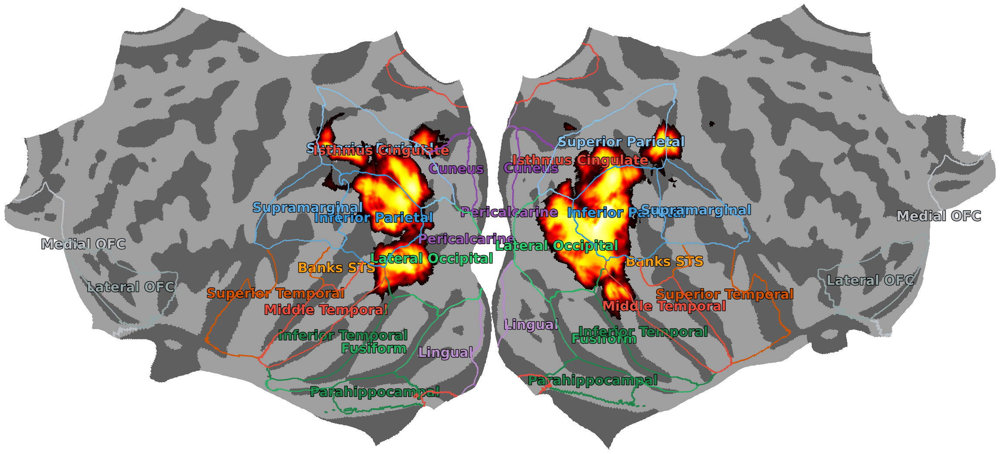

Done!


In [5]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

cortex.database.db = cortex.database.Database()

# Load tmap
tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_clipvit_p001_fisherz_fdr01.nii.gz"
fsaverage_ni = datasets.fetch_surf_fsaverage('fsaverage')
texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)
texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < 0.01] = np.nan

vertex_data = cortex.Vertex(texture, 'fsaverage', cmap='hot', vmin=0, vmax=np.nanmax(texture))

fig = cortex.quickflat.make_figure(vertex_data,
                                    with_curvature=True,
                                    with_colorbar=False,
                                    with_rois=False,
                                    with_sulci=False,
                                    with_labels=False,
                                    curvature_brightness=0.5,
                                    curvature_contrast=0.25,
                                    height=1024)

# Get flat surface coordinates
flat_pts, flat_polys = cortex.db.get_surf('fsaverage', 'flat', merge=True, nudge=True)
n_lh = cortex.db.get_surf('fsaverage', 'flat', 'lh')[0].shape[0]

# Load aparc annotations
fs_subj = '/usr/local/freesurfer/7.4.1/subjects/fsaverage'
labels_lh, _, names_lh = nib.freesurfer.read_annot(f'{fs_subj}/label/lh.aparc.annot')
labels_rh, _, names_rh = nib.freesurfer.read_annot(f'{fs_subj}/label/rh.aparc.annot')
names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

# ROIs with original aparc names and category-grouped colors
roi_map = {
    # Early visual
    'pericalcarine':      {'color': '#9B59B6', 'category': 'Early visual',      'label': 'Pericalcarine'},
    'cuneus':             {'color': '#8E44AD', 'category': 'Early visual',      'label': 'Cuneus'},
    'lingual':            {'color': '#BB8FCE', 'category': 'Early visual',      'label': 'Lingual'},

    # Ventral temporal / object-scene
    'lateraloccipital':   {'color': '#2ecc71', 'category': 'Ventral/lateral',   'label': 'Lateral Occipital'},
    'fusiform':           {'color': '#27AE60', 'category': 'Ventral/lateral',   'label': 'Fusiform'},
    'parahippocampal':    {'color': '#1E8449', 'category': 'Ventral/lateral',   'label': 'Parahippocampal'},
    'inferiortemporal':   {'color': '#1E8449', 'category': 'Ventral/lateral',   'label': 'Inferior Temporal'},

    # Temporal
    'bankssts':           {'color': '#F39C12', 'category': 'Temporal',          'label': 'Banks STS'},
    'superiortemporal':   {'color': '#D35400', 'category': 'Temporal',          'label': 'Superior Temporal'},
    'middletemporal':     {'color': '#E74C3C', 'category': 'Temporal',          'label': 'Middle Temporal'},

    # Parietal
    'superiorparietal':   {'color': '#85C1E9', 'category': 'Parietal',          'label': 'Superior Parietal'},
    'inferiorparietal':   {'color': '#3498db', 'category': 'Parietal',          'label': 'Inferior Parietal'},
    'supramarginal':      {'color': '#5DADE2', 'category': 'Parietal',          'label': 'Supramarginal'},

    # Cingulate / medial
    'isthmuscingulate':   {'color': '#E74C3C', 'category': 'Cingulate/medial',  'label': 'Isthmus Cingulate'},

    # Frontal
    'medialorbitofrontal':  {'color': '#BDC3C7', 'category': 'Frontal',         'label': 'Medial OFC'},
    'lateralorbitofrontal': {'color': '#95A5A6', 'category': 'Frontal',         'label': 'Lateral OFC'},
}

ax = fig.axes[0]

for aparc_name, roi_info in roi_map.items():
    roi_color = roi_info['color']

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx = names_lh.index(aparc_name)
        mask[:n_lh] = (labels_lh == idx)
    if aparc_name in names_rh:
        idx = names_rh.index(aparc_name)
        mask[n_lh:] = (labels_rh == idx)

    if mask.sum() == 0:
        print(f"  {aparc_name}: no vertices found, skipping")
        continue

    # Find boundary edges
    boundary_lines = []
    for tri in flat_polys:
        in_roi = mask[tri]
        if 0 < in_roi.sum() < 3:
            for i in range(3):
                v1, v2 = tri[i], tri[(i + 1) % 3]
                if mask[v1] != mask[v2]:
                    boundary_lines.append([flat_pts[v1, :2], flat_pts[v2, :2]])

    if boundary_lines:
        lc = LineCollection(boundary_lines, colors=roi_color,
                            linewidths=1.5, alpha=0.9, zorder=5)
        ax.add_collection(lc)

        # Label each hemisphere separately
        mask_lh = mask.copy()
        mask_lh[n_lh:] = False
        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask, hemi_prefix in [(mask_lh, 'L'), (mask_rh, 'R')]:
            if hemi_mask.sum() == 0:
                continue
            roi_pts = flat_pts[hemi_mask]
            cx, cy = roi_pts[:, 0].mean(), roi_pts[:, 1].mean()
            ax.text(cx, cy, roi_info['label'], color=roi_color, fontsize=22,
                    fontweight='bold', ha='center', va='center',
                    path_effects=[pe.withStroke(linewidth=2, foreground='black')])

        print(f"  Added {roi_info['label']} ({mask.sum()} vertices)")
    else:
        print(f"  {aparc_name}: no boundary lines found")

# ---------------------------------------------------------------------------
# Add colorbar at the top, not overlapping the brain
# ---------------------------------------------------------------------------
# brain_ax_pos = ax.get_position()
# cbar_ax = fig.add_axes([brain_ax_pos.x0 + 0.15,
#                          brain_ax_pos.y1 + 0.02,
#                          brain_ax_pos.width - 0.30,
#                          0.025])

# norm = mcolors.Normalize(vmin=0, vmax=np.nanmax(texture))
# sm = cm.ScalarMappable(cmap='hot', norm=norm)
# sm.set_array([])
# cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
# cbar.set_label('t-value', fontsize=10, fontweight='bold')
# cbar.ax.tick_params(labelsize=8)

# ---------------------------------------------------------------------------
# Add ROI legend grouped by category
# ---------------------------------------------------------------------------
# categories_seen = {}
# for aparc_name, roi_info in roi_map.items():
#     cat = roi_info['category']
#     if cat not in categories_seen:
#         categories_seen[cat] = []
#     categories_seen[cat].append((aparc_name, roi_info['color']))

# legend_handles = []
# for cat, items in categories_seen.items():
#     legend_handles.append(Line2D([0], [0], color='none', label=f'$\\bf{{{cat}}}$'))
#     for name, color in items:
#         clean_label = roi_map[name]['label']
#         legend_handles.append(Line2D([0], [0], color=color, linewidth=2.5, label=f'  {clean_label}'))

# ax.legend(handles=legend_handles, loc='lower left', fontsize=15,
#           framealpha=0.85, edgecolor='gray', fancybox=True,
#           ncol=2, columnspacing=1.0, handletextpad=0.5)

fig.savefig('/tmp/tmap_flatmap_aparc_rois.png', dpi=300, bbox_inches='tight')
plt.show()
print("Done!")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage
ROIs included:
bankssts
caudalanteriorcingulate
caudalmiddlefrontal
cuneus
entorhinal
frontalpole
fusiform
inferiorparietal
inferiortemporal
insula
isthmuscingulate
lateraloccipital
lateralorbitofrontal
lingual
medialorbitofrontal
middletemporal
paracentral
parahippocampal
parsopercularis
parsorbitalis
parstriangularis
pericalcarine
postcentral
posteriorcingulate
precentral
precuneus
rostralanteriorcingulate
rostralmiddlefrontal
superiorfrontal
superiorparietal
superiortemporal
supramarginal
temporalpole
transversetemporal
Added bankssts: 4333 vertices
Added caudalanteriorcingulate: 3047 vertices
Added caudalmiddlefrontal: 7230 vertices
Added cuneus: 3268 vertices
Added entorhinal: 2004 vertices
Added frontalpole: 641 vertices
Added fusiform: 9375 vertices
Added inferiorparietal: 17547 vertices
Added inferiortemporal: 8613 vertices
Added insula: 10319 vertices
Added isthmuscingulate: 4919 vertices
Added lateralo

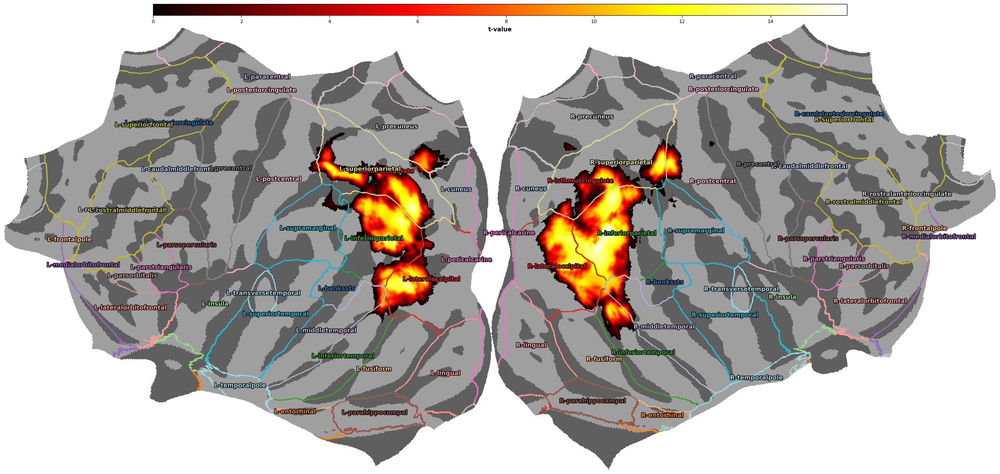

Done! Saved to: /tmp/tmap_flatmap_all_aparc_rois.png


In [6]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# ============================================================
# Setup
# ============================================================
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_clipvit_p001_fisherz_fdr01.nii.gz"

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

# ============================================================
# Load t-map and project volume to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < 0.01] = np.nan

vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=np.nanmax(texture)
)

# ============================================================
# Make pycortex flatmap
# ============================================================
fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]

# ============================================================
# Load pycortex flat surface
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf("fsaverage", "flat", "lh")[0].shape[0]

# ============================================================
# Load FreeSurfer aparc annotation
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

# ============================================================
# Automatically include ALL aparc ROIs
# ============================================================
exclude_rois = {
    "unknown",
    "corpuscallosum"
}

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])

# Give each ROI a distinct color
cmap = plt.get_cmap("tab20", len(all_rois))

roi_map = {}

for i, roi in enumerate(all_rois):
    roi_map[roi] = {
        "color": cmap(i),
        "label": roi
    }

print("ROIs included:")
for roi in all_rois:
    print(roi)

# ============================================================
# Draw aparc ROI boundaries and labels
# ============================================================
for aparc_name, roi_info in roi_map.items():

    roi_color = roi_info["color"]

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        print(f"{aparc_name}: no vertices found, skipping")
        continue

    boundary_lines = []

    for tri in flat_polys:
        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:
            for i in range(3):
                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        print(f"{aparc_name}: no boundary lines found")
        continue

    lc = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=1.2,
        alpha=0.9,
        zorder=5
    )
    ax.add_collection(lc)

    # Label left and right hemispheres separately
    mask_lh = mask.copy()
    mask_lh[n_lh:] = False

    mask_rh = mask.copy()
    mask_rh[:n_lh] = False

    for hemi_mask, hemi_prefix in [(mask_lh, "L"), (mask_rh, "R")]:

        if hemi_mask.sum() == 0:
            continue

        roi_pts = flat_pts[hemi_mask]

        cx = roi_pts[:, 0].mean()
        cy = roi_pts[:, 1].mean()

        ax.text(
            cx,
            cy,
            f"{hemi_prefix}-{roi_info['label']}",
            color=roi_color,
            fontsize=10,
            fontweight="bold",
            ha="center",
            va="center",
            zorder=6,
            path_effects=[
                pe.withStroke(linewidth=2, foreground="black")
            ]
        )

    print(f"Added {aparc_name}: {mask.sum()} vertices")

# ============================================================
# Optional colorbar
# ============================================================
brain_ax_pos = ax.get_position()

cbar_ax = fig.add_axes([
    brain_ax_pos.x0 + 0.15,
    brain_ax_pos.y1 + 0.02,
    brain_ax_pos.width - 0.30,
    0.025
])

norm = mcolors.Normalize(
    vmin=0,
    vmax=np.nanmax(texture)
)

sm = cm.ScalarMappable(
    cmap="hot",
    norm=norm
)

sm.set_array([])

cbar = fig.colorbar(
    sm,
    cax=cbar_ax,
    orientation="horizontal"
)

cbar.set_label(
    "t-value",
    fontsize=10,
    fontweight="bold"
)

cbar.ax.tick_params(labelsize=8)

# ============================================================
# Save figure
# ============================================================
out_path = "/tmp/tmap_flatmap_all_aparc_rois.png"

fig.savefig(
    out_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(f"Done! Saved to: {out_path}")

In [7]:
# ============================================================
# Draw only ROIs containing non-zero t-values
# ============================================================

t_threshold = 0.01   # same threshold you used earlier

for aparc_name, roi_info in roi_map.items():

    roi_color = roi_info["color"]

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    # -------------------------------------------------------
    # Keep only ROIs containing suprathreshold t-values
    # -------------------------------------------------------
    roi_tvals = texture[mask]

    valid = roi_tvals[~np.isnan(roi_tvals)]

    if len(valid) == 0:
        continue

    if np.nanmax(np.abs(valid)) < t_threshold:
        continue

    print(
        f"{aparc_name}: "
        f"N={len(valid)} vertices, "
        f"max t={np.nanmax(valid):.2f}"
    )

    # -------------------------------------------------------
    # Find ROI boundary
    # -------------------------------------------------------
    boundary_lines = []

    for tri in flat_polys:

        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:

            for i in range(3):

                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        continue

    lc = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=2,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc)

    # -------------------------------------------------------
    # ROI label
    # -------------------------------------------------------
    roi_pts = flat_pts[mask]

    cx = roi_pts[:, 0].mean()
    cy = roi_pts[:, 1].mean()

    ax.text(
        cx,
        cy,
        aparc_name,
        color=roi_color,
        fontsize=14,
        fontweight="bold",
        ha="center",
        va="center",
        zorder=6,
        path_effects=[
            pe.withStroke(
                linewidth=2,
                foreground="black"
            )
        ]
    )

cuneus: N=46 vertices, max t=2.61
inferiorparietal: N=10196 vertices, max t=15.73
inferiortemporal: N=1324 vertices, max t=11.93
lateraloccipital: N=5608 vertices, max t=14.33
middletemporal: N=1183 vertices, max t=11.31
postcentral: N=984 vertices, max t=13.24
precuneus: N=695 vertices, max t=10.09
superiorparietal: N=8534 vertices, max t=14.68
supramarginal: N=647 vertices, max t=1.30


[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

ROIs containing nonzero t-map values:
             roi  n_total_vertices  n_nonzero_vertices  percent_nonzero     max_t   mean_t
inferiorparietal             17547               10196        58.106799 15.731064 7.467257
lateraloccipital             12342                5608        45.438341 14.325567 7.345268
superiorparietal             20678                8534        41.270916 14.675947 4.539089
inferiortemporal              8613                1324        15.372112 11.925495 3.954379
  middletemporal              9509                1183        12.440846 11.310070 5.107820
     postcentral             18657                 984         5.274160 13.239520 4.437906
       precuneus             15283                 695         4.547536 10.086711 2.753898
   supramarginal             16750                 647         3.862687  1.302067 0.266464
          cuneus              3268                  46         1.40

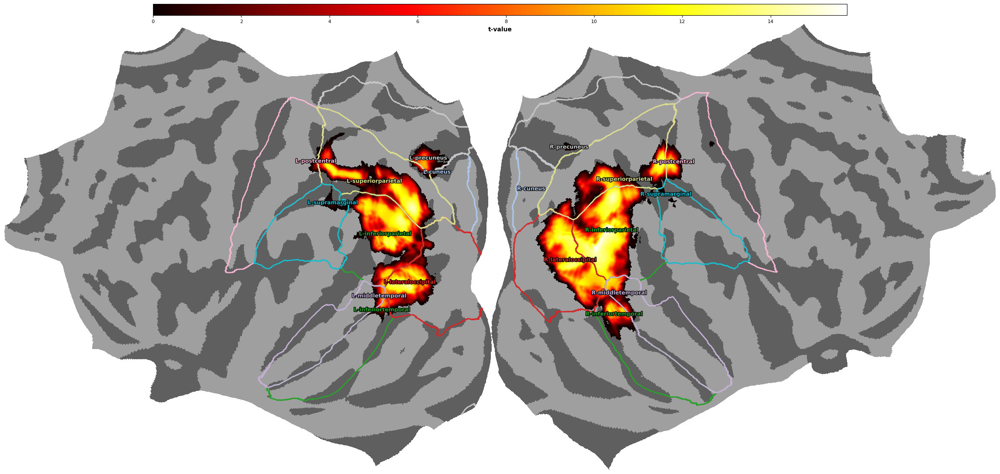


Done! Saved figure to: /tmp/tmap_flatmap_only_nonzero_aparc_rois.png


In [8]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# ============================================================
# Setup
# ============================================================
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_clipvit_p001_fisherz_fdr01.nii.gz"

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

out_fig = "/tmp/tmap_flatmap_only_nonzero_aparc_rois.png"
out_csv = "/tmp/nonzero_aparc_roi_summary.csv"


# ============================================================
# Parameters
# ============================================================
t_threshold = 0.01

exclude_rois = {
    "unknown",
    "corpuscallosum"
}

draw_labels = True
draw_colorbar = True


# ============================================================
# Load t-map and project to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])

# Treat very small values as empty
texture[np.abs(texture) < t_threshold] = np.nan


# ============================================================
# Make pycortex flatmap
# ============================================================
vmax = np.nanmax(texture)

vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=vmax
)

fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]


# ============================================================
# Load pycortex flat surface
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load FreeSurfer aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [
    n.decode() if isinstance(n, bytes) else n
    for n in names_lh
]

names_rh = [
    n.decode() if isinstance(n, bytes) else n
    for n in names_rh
]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])


# ============================================================
# Make ROI colors
# ============================================================
cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Find ROIs with nonzero t-map values
# ============================================================
roi_summary = []
roi_masks = {}

for aparc_name in all_rois:

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        continue

    roi_vals = texture[mask]
    valid_vals = roi_vals[~np.isnan(roi_vals)]

    if len(valid_vals) == 0:
        continue

    n_sig = len(valid_vals)
    n_total = mask.sum()
    sig_fraction = n_sig / n_total

    roi_summary.append({
        "roi": aparc_name,
        "n_total_vertices": n_total,
        "n_nonzero_vertices": n_sig,
        "percent_nonzero": sig_fraction * 100,
        "max_t": np.nanmax(valid_vals),
        "mean_t": np.nanmean(valid_vals)
    })

    roi_masks[aparc_name] = mask


roi_df = pd.DataFrame(roi_summary)

roi_df = roi_df.sort_values(
    by="percent_nonzero",
    ascending=False
)

print("\nROIs containing nonzero t-map values:")
print(roi_df.to_string(index=False))

roi_df.to_csv(out_csv, index=False)
print(f"\nSaved ROI summary to: {out_csv}")


# ============================================================
# Plot only ROIs with nonzero t-map values
# ============================================================
for aparc_name, mask in roi_masks.items():

    roi_color = roi_colors[aparc_name]

    boundary_lines = []

    for tri in flat_polys:

        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:

            for i in range(3):

                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        continue

    lc = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=1.8,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc)

    if draw_labels:

        mask_lh = mask.copy()
        mask_lh[n_lh:] = False

        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask, hemi_prefix in [
            (mask_lh, "L"),
            (mask_rh, "R")
        ]:

            if hemi_mask.sum() == 0:
                continue

            # Label at center of significant vertices, not whole ROI
            sig_mask = hemi_mask & ~np.isnan(texture)

            if sig_mask.sum() > 0:
                roi_pts = flat_pts[sig_mask]
            else:
                roi_pts = flat_pts[hemi_mask]

            cx = roi_pts[:, 0].mean()
            cy = roi_pts[:, 1].mean()

            ax.text(
                cx,
                cy,
                f"{hemi_prefix}-{aparc_name}",
                color=roi_color,
                fontsize=9,
                fontweight="bold",
                ha="center",
                va="center",
                zorder=6,
                path_effects=[
                    pe.withStroke(
                        linewidth=2,
                        foreground="black"
                    )
                ]
            )


# ============================================================
# Add colorbar
# ============================================================
if draw_colorbar:

    brain_ax_pos = ax.get_position()

    cbar_ax = fig.add_axes([
        brain_ax_pos.x0 + 0.15,
        brain_ax_pos.y1 + 0.02,
        brain_ax_pos.width - 0.30,
        0.025
    ])

    norm = mcolors.Normalize(
        vmin=0,
        vmax=vmax
    )

    sm = cm.ScalarMappable(
        cmap="hot",
        norm=norm
    )

    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        cax=cbar_ax,
        orientation="horizontal"
    )

    cbar.set_label(
        "t-value",
        fontsize=10,
        fontweight="bold"
    )

    cbar.ax.tick_params(labelsize=8)


# ============================================================
# Save and show
# ============================================================
fig.savefig(
    out_fig,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(f"\nDone! Saved figure to: {out_fig}")

## Set threshold to clipvit

In [21]:
import nibabel as nib
import numpy as np
import os

# ============================================================
# Input
# ============================================================
input_file = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th0.nii.gz"

threshold = 9.5

# ============================================================
# Output filename
# ============================================================
base_dir = os.path.dirname(input_file)

output_file = os.path.join(
    base_dir,
    f"tmap_clipvit_p001_fisherz_fdr001_th{threshold}.nii.gz"
)

# ============================================================
# Load NIfTI
# ============================================================
img = nib.load(input_file)
data = img.get_fdata()

# ============================================================
# Apply threshold
# Keep only voxels >= threshold
# ============================================================
data_thr = data.copy()
data_thr[data_thr < threshold] = 0

# ============================================================
# Save thresholded NIfTI
# ============================================================
img_thr = nib.Nifti1Image(
    data_thr,
    affine=img.affine,
    header=img.header
)

nib.save(img_thr, output_file)

print(f"Saved thresholded map:")
print(output_file)

print(f"Voxels kept: {(data_thr >= threshold).sum()}")
print(f"Max t-value: {np.max(data_thr):.3f}")

Saved thresholded map:
/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th9.5.nii.gz
Voxels kept: 2625
Max t-value: 17.698


In [52]:
import nibabel as nib
import numpy as np
import os

from scipy.ndimage import label

# ============================================================
# Input
# ============================================================
input_file = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th0.nii.gz"

threshold = 10
min_cluster_size = 100

# ============================================================
# Output filename
# ============================================================
base_dir = os.path.dirname(input_file)

output_file = os.path.join(
    base_dir,
    f"tmap_clipvit_p001_fisherz_fdr001_th{threshold}_cluster{min_cluster_size}.nii.gz"
)

# ============================================================
# Load NIfTI
# ============================================================
img = nib.load(input_file)
data = img.get_fdata()

# ============================================================
# Threshold
# ============================================================
mask = data >= threshold

print(f"Voxels above threshold: {mask.sum()}")

# ============================================================
# Find connected clusters (26-connectivity)
# ============================================================
structure = np.ones((3, 3, 3), dtype=int)

labeled_clusters, n_clusters = label(mask, structure=structure)

print(f"Clusters found: {n_clusters}")

# ============================================================
# Remove small clusters
# ============================================================
keep_mask = np.zeros_like(mask, dtype=bool)

cluster_sizes = []

for cluster_id in range(1, n_clusters + 1):

    cluster_size = np.sum(labeled_clusters == cluster_id)

    cluster_sizes.append(cluster_size)

    if cluster_size >= min_cluster_size:
        keep_mask |= (labeled_clusters == cluster_id)

print(f"Largest cluster: {max(cluster_sizes) if cluster_sizes else 0}")
print(f"Clusters surviving: {np.unique(labeled_clusters[keep_mask]).size}")

# ============================================================
# Apply cluster mask
# ============================================================
data_thr = np.zeros_like(data)

data_thr[keep_mask] = data[keep_mask]

# ============================================================
# Save NIfTI
# ============================================================
img_thr = nib.Nifti1Image(
    data_thr,
    affine=img.affine,
    header=img.header
)

nib.save(img_thr, output_file)

print("\nSaved thresholded map:")
print(output_file)

print(f"Final voxels kept: {(data_thr > 0).sum()}")
print(f"Max t-value: {np.max(data_thr):.3f}")

Voxels above threshold: 2054
Clusters found: 10
Largest cluster: 1104
Clusters surviving: 2

Saved thresholded map:
/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th10_cluster100.nii.gz
Final voxels kept: 1946
Max t-value: 17.698


In [48]:
import nibabel as nib
import numpy as np
import os

from scipy.ndimage import label

# ============================================================
# Input
# ============================================================
input_file = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_gist_norm_p001.nii.gz"

threshold = 9.5
min_cluster_size = 100

# ============================================================
# Output filename
# ============================================================
base_dir = os.path.dirname(input_file)

output_file = os.path.join(
    base_dir,
    f"tmap_gist_p001_fisherz_fdr001_th{threshold}_cluster{min_cluster_size}.nii.gz"
)

# ============================================================
# Load NIfTI
# ============================================================
img = nib.load(input_file)
data = img.get_fdata()

# ============================================================
# Threshold
# ============================================================
mask = data >= threshold

print(f"Voxels above threshold: {mask.sum()}")

# ============================================================
# Find connected clusters (26-connectivity)
# ============================================================
structure = np.ones((3, 3, 3), dtype=int)

labeled_clusters, n_clusters = label(mask, structure=structure)

print(f"Clusters found: {n_clusters}")

# ============================================================
# Remove small clusters
# ============================================================
keep_mask = np.zeros_like(mask, dtype=bool)

cluster_sizes = []

for cluster_id in range(1, n_clusters + 1):

    cluster_size = np.sum(labeled_clusters == cluster_id)

    cluster_sizes.append(cluster_size)

    if cluster_size >= min_cluster_size:
        keep_mask |= (labeled_clusters == cluster_id)

print(f"Largest cluster: {max(cluster_sizes) if cluster_sizes else 0}")
print(f"Clusters surviving: {np.unique(labeled_clusters[keep_mask]).size}")

# ============================================================
# Apply cluster mask
# ============================================================
data_thr = np.zeros_like(data)

data_thr[keep_mask] = data[keep_mask]

# ============================================================
# Save NIfTI
# ============================================================
img_thr = nib.Nifti1Image(
    data_thr,
    affine=img.affine,
    header=img.header
)

nib.save(img_thr, output_file)

print("\nSaved thresholded map:")
print(output_file)

print(f"Final voxels kept: {(data_thr > 0).sum()}")
print(f"Max t-value: {np.max(data_thr):.3f}")

Voxels above threshold: 887
Clusters found: 1
Largest cluster: 887
Clusters surviving: 1

Saved thresholded map:
/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_gist_p001_fisherz_fdr001_th9.5_cluster100.nii.gz
Final voxels kept: 887
Max t-value: 15.320


[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

ROIs containing nonzero t-map values:
             roi  n_total_vertices  n_nonzero_vertices  percent_nonzero     max_t   mean_t
inferiorparietal             17547               11109        63.309968 15.725852 7.775600
superiorparietal             20678               10047        48.587871 14.652993 5.380523
lateraloccipital             12342                5866        47.528764 14.330821 7.646148
inferiortemporal              8613                1906        22.129339 11.924335 3.900590
  middletemporal              9509                1313        13.807971 11.314478 6.120359
     postcentral             18657                1206         6.464062 13.330479 4.160896
   supramarginal             16750                 994         5.934328  2.820560 0.393887
       precuneus             15283                 889         5.816921 10.381862 3.019766
        bankssts              4333                 139         3.20

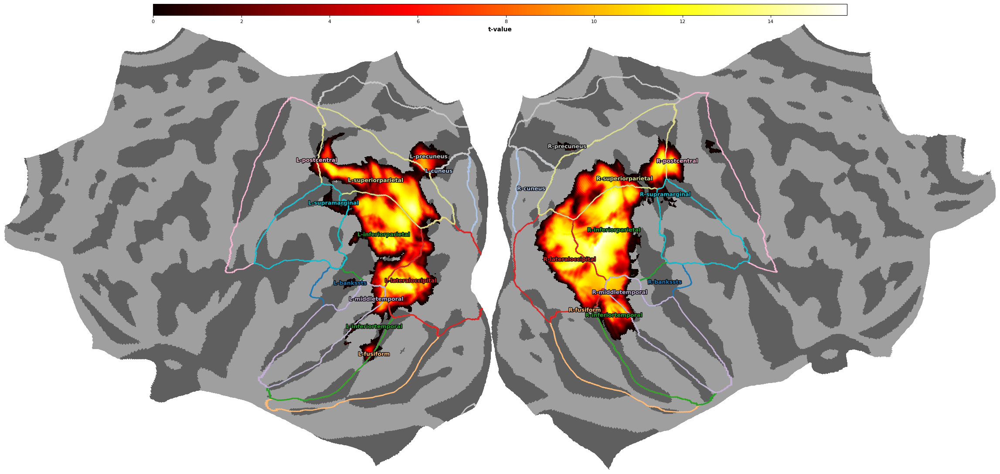


Done! Saved figure to: /tmp/tmap_flatmap_only_nonzero_aparc_rois.png


In [24]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# ============================================================
# Setup
# ============================================================
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th9.5_cluster100.nii.gz"

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

out_fig = "/tmp/tmap_flatmap_only_nonzero_aparc_rois.png"
out_csv = "/tmp/nonzero_aparc_roi_summary.csv"


# ============================================================
# Parameters
# ============================================================
t_threshold = 0.01

exclude_rois = {
    "unknown",
    "corpuscallosum"
}

draw_labels = True
draw_colorbar = True


# ============================================================
# Load t-map and project to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])

# Treat very small values as empty
texture[np.abs(texture) < t_threshold] = np.nan


# ============================================================
# Make pycortex flatmap
# ============================================================
vmax = np.nanmax(texture)

vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=vmax
)

fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]


# ============================================================
# Load pycortex flat surface
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load FreeSurfer aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [
    n.decode() if isinstance(n, bytes) else n
    for n in names_lh
]

names_rh = [
    n.decode() if isinstance(n, bytes) else n
    for n in names_rh
]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])


# ============================================================
# Make ROI colors
# ============================================================
cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Find ROIs with nonzero t-map values
# ============================================================
roi_summary = []
roi_masks = {}

for aparc_name in all_rois:

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        continue

    roi_vals = texture[mask]
    valid_vals = roi_vals[~np.isnan(roi_vals)]

    if len(valid_vals) == 0:
        continue

    n_sig = len(valid_vals)
    n_total = mask.sum()
    sig_fraction = n_sig / n_total

    roi_summary.append({
        "roi": aparc_name,
        "n_total_vertices": n_total,
        "n_nonzero_vertices": n_sig,
        "percent_nonzero": sig_fraction * 100,
        "max_t": np.nanmax(valid_vals),
        "mean_t": np.nanmean(valid_vals)
    })

    roi_masks[aparc_name] = mask


roi_df = pd.DataFrame(roi_summary)

roi_df = roi_df.sort_values(
    by="percent_nonzero",
    ascending=False
)

print("\nROIs containing nonzero t-map values:")
print(roi_df.to_string(index=False))

roi_df.to_csv(out_csv, index=False)
print(f"\nSaved ROI summary to: {out_csv}")


# ============================================================
# Plot only ROIs with nonzero t-map values
# ============================================================
for aparc_name, mask in roi_masks.items():

    roi_color = roi_colors[aparc_name]

    boundary_lines = []

    for tri in flat_polys:

        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:

            for i in range(3):

                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        continue

    lc = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=1.8,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc)

    if draw_labels:

        mask_lh = mask.copy()
        mask_lh[n_lh:] = False

        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask, hemi_prefix in [
            (mask_lh, "L"),
            (mask_rh, "R")
        ]:

            if hemi_mask.sum() == 0:
                continue

            # Label at center of significant vertices, not whole ROI
            sig_mask = hemi_mask & ~np.isnan(texture)

            if sig_mask.sum() > 0:
                roi_pts = flat_pts[sig_mask]
            else:
                roi_pts = flat_pts[hemi_mask]

            cx = roi_pts[:, 0].mean()
            cy = roi_pts[:, 1].mean()

            ax.text(
                cx,
                cy,
                f"{hemi_prefix}-{aparc_name}",
                color=roi_color,
                fontsize=9,
                fontweight="bold",
                ha="center",
                va="center",
                zorder=6,
                path_effects=[
                    pe.withStroke(
                        linewidth=2,
                        foreground="black"
                    )
                ]
            )


# ============================================================
# Add colorbar
# ============================================================
if draw_colorbar:

    brain_ax_pos = ax.get_position()

    cbar_ax = fig.add_axes([
        brain_ax_pos.x0 + 0.15,
        brain_ax_pos.y1 + 0.02,
        brain_ax_pos.width - 0.30,
        0.025
    ])

    norm = mcolors.Normalize(
        vmin=0,
        vmax=vmax
    )

    sm = cm.ScalarMappable(
        cmap="hot",
        norm=norm
    )

    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        cax=cbar_ax,
        orientation="horizontal"
    )

    cbar.set_label(
        "t-value",
        fontsize=10,
        fontweight="bold"
    )

    cbar.ax.tick_params(labelsize=8)


# ============================================================
# Save and show
# ============================================================
fig.savefig(
    out_fig,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(f"\nDone! Saved figure to: {out_fig}")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

ROIs containing nonzero t-map values:
             roi  n_total_vertices  n_nonzero_vertices  percent_nonzero     max_t   mean_t
inferiorparietal             17547               11109        63.309968 15.725852 7.775600
superiorparietal             20678               10047        48.587871 14.652993 5.380523
lateraloccipital             12342                5866        47.528764 14.330821 7.646148
inferiortemporal              8613                1906        22.129339 11.924335 3.900590
  middletemporal              9509                1313        13.807971 11.314478 6.120359
     postcentral             18657                1206         6.464062 13.330479 4.160896
   supramarginal             16750                 994         5.934328  2.820560 0.393887
       precuneus             15283                 889         5.816921 10.381862 3.019766
        bankssts              4333                 139         3.20

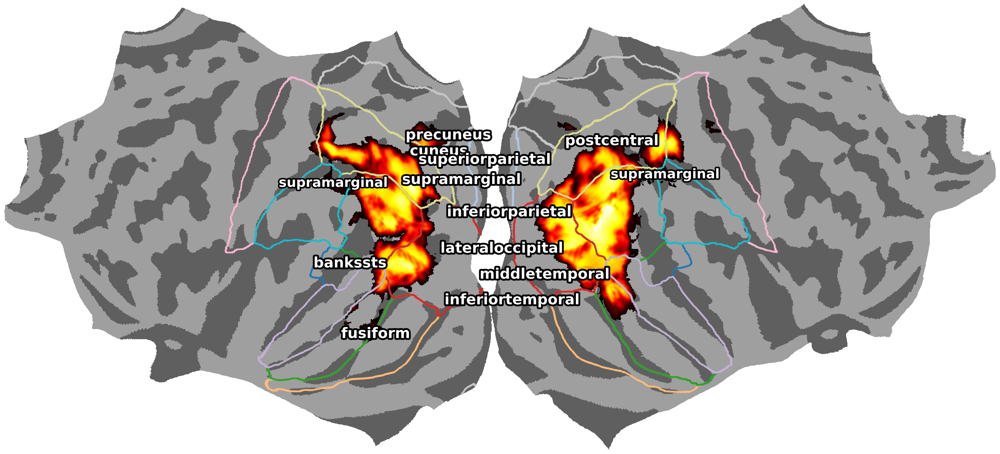


Done! Saved figure to: /tmp/tmap_flatmap_only_nonzero_aparc_rois.png


In [27]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# ============================================================
# Setup
# ============================================================
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th9.5_cluster100.nii.gz"

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

out_fig = "/tmp/tmap_flatmap_only_nonzero_aparc_rois.png"
out_csv = "/tmp/nonzero_aparc_roi_summary.csv"


# ============================================================
# Parameters
# ============================================================
t_threshold = 0.01

exclude_rois = {
    "unknown",
    "corpuscallosum"
}

draw_labels = True
draw_colorbar = True


# ============================================================
# Load t-map and project to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])

# Treat very small values as empty
texture[np.abs(texture) < t_threshold] = np.nan


# ============================================================
# Make pycortex flatmap
# ============================================================
vmax = np.nanmax(texture)

vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=vmax
)

fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]


# ============================================================
# Load pycortex flat surface
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load FreeSurfer aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [
    n.decode() if isinstance(n, bytes) else n
    for n in names_lh
]

names_rh = [
    n.decode() if isinstance(n, bytes) else n
    for n in names_rh
]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])


# ============================================================
# Make ROI colors
# ============================================================
cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Find ROIs with nonzero t-map values
# ============================================================
roi_summary = []
roi_masks = {}

for aparc_name in all_rois:

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        continue

    roi_vals = texture[mask]
    valid_vals = roi_vals[~np.isnan(roi_vals)]

    if len(valid_vals) == 0:
        continue

    n_sig = len(valid_vals)
    n_total = mask.sum()
    sig_fraction = n_sig / n_total

    roi_summary.append({
        "roi": aparc_name,
        "n_total_vertices": n_total,
        "n_nonzero_vertices": n_sig,
        "percent_nonzero": sig_fraction * 100,
        "max_t": np.nanmax(valid_vals),
        "mean_t": np.nanmean(valid_vals)
    })

    roi_masks[aparc_name] = mask


roi_df = pd.DataFrame(roi_summary)

roi_df = roi_df.sort_values(
    by="percent_nonzero",
    ascending=False
)

print("\nROIs containing nonzero t-map values:")
print(roi_df.to_string(index=False))

roi_df.to_csv(out_csv, index=False)
print(f"\nSaved ROI summary to: {out_csv}")


# ============================================================
# Plot only ROIs with nonzero t-map values
# ============================================================
# ============================================================
# Plot only ROIs with nonzero t-map values
# ============================================================

for aparc_name, mask in roi_masks.items():

    roi_color = roi_colors[aparc_name]

    boundary_lines = []

    for tri in flat_polys:
        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:
            for i in range(3):
                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        continue

    # IMPORTANT: create a NEW LineCollection every loop
    lc_new = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=3.0,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc_new)

    # --------------------------------------------------------
    # Publication-style label: no L/R prefix
    # --------------------------------------------------------
    if draw_labels:

        sig_mask = mask & ~np.isnan(texture)

        if sig_mask.sum() > 0:
            roi_pts = flat_pts[sig_mask]
        else:
            roi_pts = flat_pts[mask]

        cx = roi_pts[:, 0].mean()
        cy = roi_pts[:, 1].mean()

        ax.text(
            cx,
            cy,
            aparc_name.replace("_", " "),
            color="white",
            fontsize=24,
            fontweight="bold",
            ha="center",
            va="center",
            zorder=10,
            path_effects=[
                pe.withStroke(
                    linewidth=6,
                    foreground="black"
                )
            ]
        )

    print(f"Added {aparc_name}")


# ============================================================
# Add colorbar
# ============================================================
# ============================================================
# Plot publication-quality labels
# ============================================================
if draw_labels:

    plotted_labels = set()

    mask_lh = mask.copy()
    mask_lh[n_lh:] = False

    mask_rh = mask.copy()
    mask_rh[:n_lh] = False

    for hemi_mask in [mask_lh, mask_rh]:

        if hemi_mask.sum() == 0:
            continue

        sig_mask = hemi_mask & ~np.isnan(texture)

        if sig_mask.sum() > 0:
            roi_pts = flat_pts[sig_mask]
        else:
            roi_pts = flat_pts[hemi_mask]

        cx = roi_pts[:, 0].mean()
        cy = roi_pts[:, 1].mean()

        label_name = aparc_name.replace('_', ' ')

        # prevent duplicate labels if L and R overlap
        key = (
            label_name,
            round(cx, 1),
            round(cy, 1)
        )

        if key in plotted_labels:
            continue

        plotted_labels.add(key)

        ax.text(
            cx,
            cy,
            label_name,

            color='white',
            fontsize=22,
            fontweight='bold',

            ha='center',
            va='center',

            zorder=10,

            path_effects=[

                # thick black outline
                pe.withStroke(
                    linewidth=5,
                    foreground='black'
                )

            ]
        )


# ============================================================
# Save and show
# ============================================================
fig.savefig(
    out_fig,
    dpi=600,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print(f"\nDone! Saved figure to: {out_fig}")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

ROIs containing nonzero t-map values:
             roi       label  n_total_vertices  n_nonzero_vertices  percent_nonzero     max_t   mean_t
inferiorparietal         IPL             17547               11109        63.309968 15.725852 7.775600
superiorparietal         SPL             20678               10047        48.587871 14.652993 5.380523
lateraloccipital          LO             12342                5866        47.528764 14.330821 7.646148
inferiortemporal         ITG              8613                1906        22.129339 11.924335 3.900590
  middletemporal         MTG              9509                1313        13.807971 11.314478 6.120359
     postcentral postcentral             18657                1206         6.464062 13.330479 4.160896
   supramarginal         SMG             16750                 994         5.934328  2.820560 0.393887
       precuneus        PCUN             15283                

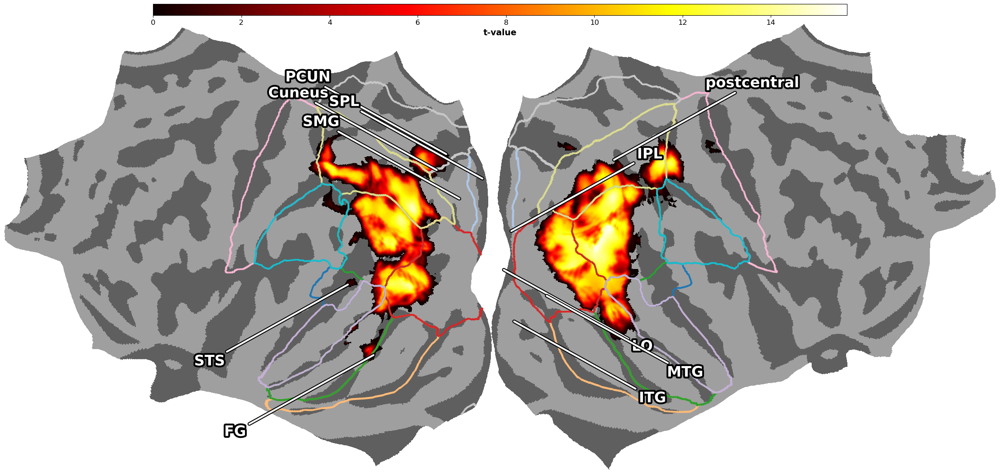


Done! Saved figure to: /tmp/tmap_flatmap_aparc_rois_with_leader_lines.png
Saved ROI summary to: /tmp/nonzero_aparc_roi_summary.csv


In [28]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# ============================================================
# Setup
# ============================================================
plt.close("all")
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th9.5_cluster100.nii.gz"

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

out_fig = "/tmp/tmap_flatmap_aparc_rois_with_leader_lines.png"
out_csv = "/tmp/nonzero_aparc_roi_summary.csv"


# ============================================================
# Parameters
# ============================================================
t_threshold = 0.01
draw_labels = True
draw_colorbar = True

exclude_rois = {
    "unknown",
    "corpuscallosum"
}

# Short publication-style labels
label_map = {
    "bankssts": "STS",
    "superiortemporal": "STG",
    "middletemporal": "MTG",
    "inferiortemporal": "ITG",
    "inferiorparietal": "IPL",
    "supramarginal": "SMG",
    "fusiform": "FG",
    "lateraloccipital": "LO",
    "lingual": "LG",
    "cuneus": "Cuneus",
    "pericalcarine": "V1",
    "parahippocampal": "PHG",
    "precuneus": "PCUN",
    "superiorparietal": "SPL"
}


# ============================================================
# Load t-map and project to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < t_threshold] = np.nan

vmax = np.nanmax(texture)


# ============================================================
# Make pycortex flatmap
# ============================================================
vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=vmax
)

fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]


# ============================================================
# Load flat surface
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load FreeSurfer aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])


# ============================================================
# ROI colors
# ============================================================
cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Find ROIs overlapping nonzero t-map values
# ============================================================
roi_summary = []
roi_masks = {}

for aparc_name in all_rois:

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        continue

    roi_vals = texture[mask]
    valid_vals = roi_vals[~np.isnan(roi_vals)]

    if len(valid_vals) == 0:
        continue

    n_sig = len(valid_vals)
    n_total = mask.sum()

    roi_summary.append({
        "roi": aparc_name,
        "label": label_map.get(aparc_name, aparc_name),
        "n_total_vertices": n_total,
        "n_nonzero_vertices": n_sig,
        "percent_nonzero": n_sig / n_total * 100,
        "max_t": np.nanmax(valid_vals),
        "mean_t": np.nanmean(valid_vals)
    })

    roi_masks[aparc_name] = mask


roi_df = pd.DataFrame(roi_summary).sort_values(
    by="percent_nonzero",
    ascending=False
)

print("\nROIs containing nonzero t-map values:")
print(roi_df.to_string(index=False))

roi_df.to_csv(out_csv, index=False)


# ============================================================
# Helper: create label offsets
# ============================================================
def get_label_offset(cx, cy):
    """
    Put labels slightly outside the local ROI center.
    Adjust these numbers if labels overlap.
    """
    if cx < 0:
        dx = -90
    else:
        dx = 90

    if cy < 0:
        dy = -50
    else:
        dy = 50

    return dx, dy


# ============================================================
# Plot ROIs and leader-line labels
# ============================================================
for aparc_name, mask in roi_masks.items():

    roi_color = roi_colors[aparc_name]

    # --------------------------------------------------------
    # ROI boundary
    # --------------------------------------------------------
    boundary_lines = []

    for tri in flat_polys:
        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:
            for i in range(3):
                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        continue

    lc_new = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=3.0,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc_new)

    # --------------------------------------------------------
    # Label with leader line
    # --------------------------------------------------------
    if draw_labels:

        sig_mask = mask & ~np.isnan(texture)

        if sig_mask.sum() > 0:
            roi_pts = flat_pts[sig_mask]
        else:
            roi_pts = flat_pts[mask]

        roi_x = roi_pts[:, 0].mean()
        roi_y = roi_pts[:, 1].mean()

        dx, dy = get_label_offset(roi_x, roi_y)

        label_x = roi_x + dx
        label_y = roi_y + dy

        label_text = label_map.get(
            aparc_name,
            aparc_name.replace("_", " ")
        )

        ann = ax.annotate(
            label_text,
            xy=(roi_x, roi_y),
            xytext=(label_x, label_y),

            color="white",
            fontsize=24,
            fontweight="bold",

            ha="center",
            va="center",

            arrowprops=dict(
                arrowstyle="-",
                color="white",
                lw=3.0,
                shrinkA=4,
                shrinkB=4
            ),

            zorder=20,

            path_effects=[
                pe.withStroke(
                    linewidth=6,
                    foreground="black"
                )
            ]
        )

        if ann.arrow_patch is not None:
            ann.arrow_patch.set_path_effects([
                pe.Stroke(linewidth=6, foreground="black"),
                pe.Normal()
            ])

    print(f"Added {aparc_name}")


# ============================================================
# Colorbar
# ============================================================
if draw_colorbar:

    brain_ax_pos = ax.get_position()

    cbar_ax = fig.add_axes([
        brain_ax_pos.x0 + 0.15,
        brain_ax_pos.y1 + 0.02,
        brain_ax_pos.width - 0.30,
        0.025
    ])

    norm = mcolors.Normalize(
        vmin=0,
        vmax=vmax
    )

    sm = cm.ScalarMappable(
        cmap="hot",
        norm=norm
    )

    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        cax=cbar_ax,
        orientation="horizontal"
    )

    cbar.set_label(
        "t-value",
        fontsize=14,
        fontweight="bold"
    )

    cbar.ax.tick_params(labelsize=12)


# ============================================================
# Save and show
# ============================================================
fig.savefig(
    out_fig,
    dpi=600,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print(f"\nDone! Saved figure to: {out_fig}")
print(f"Saved ROI summary to: {out_csv}")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

ROIs containing nonzero t-map values:
   roi_full_name roi_short_name  n_total_vertices  n_nonzero_vertices  percent_nonzero     max_t   mean_t
inferiorparietal            IPL             17547               11109        63.309968 15.725852 7.775600
superiorparietal            SPL             20678               10047        48.587871 14.652993 5.380523
lateraloccipital             LO             12342                5866        47.528764 14.330821 7.646148
inferiortemporal            ITG              8613                1906        22.129339 11.924335 3.900590
  middletemporal            MTG              9509                1313        13.807971 11.314478 6.120359
     postcentral    postcentral             18657                1206         6.464062 13.330479 4.160896
   supramarginal            SMG             16750                 994         5.934328  2.820560 0.393887
       precuneus      Precuneus       

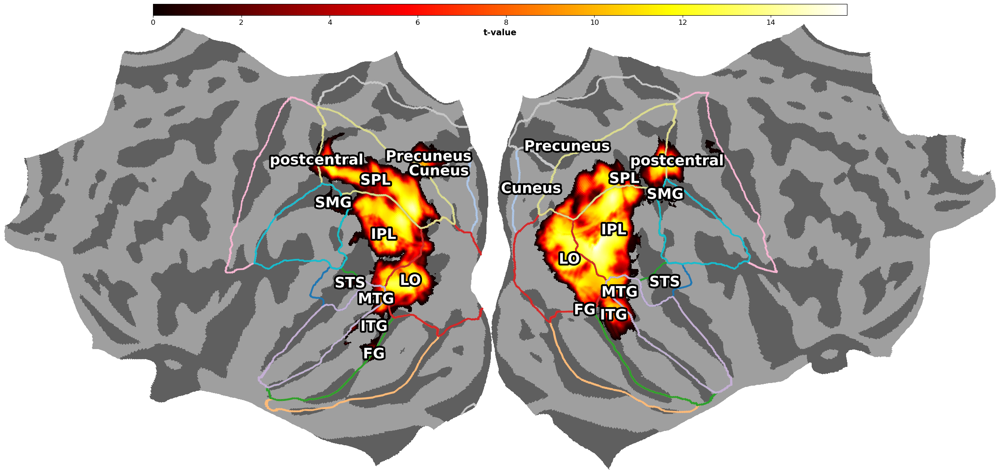


Done! Saved figure to: /tmp/tmap_flatmap_aparc_rois_short_labels.png
Saved ROI summary to: /tmp/nonzero_aparc_roi_summary.csv


In [29]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# ============================================================
# Setup
# ============================================================
plt.close("all")
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th9.5_cluster100.nii.gz"

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

out_fig = "/tmp/tmap_flatmap_aparc_rois_short_labels.png"
out_csv = "/tmp/nonzero_aparc_roi_summary.csv"


# ============================================================
# Parameters
# ============================================================
t_threshold = 0.01
draw_labels = True
draw_colorbar = True

exclude_rois = {
    "unknown",
    "corpuscallosum"
}

label_map = {
    "bankssts": "STS",
    "superiortemporal": "STG",
    "middletemporal": "MTG",
    "inferiortemporal": "ITG",
    "inferiorparietal": "IPL",
    "supramarginal": "SMG",
    "fusiform": "FG",
    "lateraloccipital": "LO",
    "lingual": "LG",
    "cuneus": "Cuneus",
    "pericalcarine": "V1",
    "parahippocampal": "PHG",
    "precuneus": "Precuneus",
    "superiorparietal": "SPL"
}


# ============================================================
# Load t-map and project to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < t_threshold] = np.nan

vmax = np.nanmax(texture)


# ============================================================
# Make pycortex flatmap
# ============================================================
vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=vmax
)

fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]


# ============================================================
# Load flat surface
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load FreeSurfer aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])


# ============================================================
# ROI colors
# ============================================================
cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Find ROIs overlapping nonzero t-map values
# ============================================================
roi_summary = []
roi_masks = {}

for aparc_name in all_rois:

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        continue

    roi_vals = texture[mask]
    valid_vals = roi_vals[~np.isnan(roi_vals)]

    if len(valid_vals) == 0:
        continue

    n_sig = len(valid_vals)
    n_total = mask.sum()

    roi_summary.append({
        "roi_full_name": aparc_name,
        "roi_short_name": label_map.get(aparc_name, aparc_name),
        "n_total_vertices": n_total,
        "n_nonzero_vertices": n_sig,
        "percent_nonzero": n_sig / n_total * 100,
        "max_t": np.nanmax(valid_vals),
        "mean_t": np.nanmean(valid_vals)
    })

    roi_masks[aparc_name] = mask


roi_df = pd.DataFrame(roi_summary).sort_values(
    by="percent_nonzero",
    ascending=False
)

print("\nROIs containing nonzero t-map values:")
print(roi_df.to_string(index=False))

print("\nShort-name mapping:")
for _, row in roi_df.iterrows():
    print(f"{row['roi_short_name']:12s} = {row['roi_full_name']}")

roi_df.to_csv(out_csv, index=False)


# ============================================================
# Plot ROIs and short labels directly on each hemisphere
# ============================================================
for aparc_name, mask in roi_masks.items():

    roi_color = roi_colors[aparc_name]

    boundary_lines = []

    for tri in flat_polys:
        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:
            for i in range(3):
                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        continue

    lc_new = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=3.0,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc_new)

    if draw_labels:

        mask_lh = mask.copy()
        mask_lh[n_lh:] = False

        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask in [mask_lh, mask_rh]:

            if hemi_mask.sum() == 0:
                continue

            sig_mask = hemi_mask & ~np.isnan(texture)

            if sig_mask.sum() > 0:
                roi_pts = flat_pts[sig_mask]
            else:
                roi_pts = flat_pts[hemi_mask]

            cx = roi_pts[:, 0].mean()
            cy = roi_pts[:, 1].mean()

            label_text = label_map.get(
                aparc_name,
                aparc_name.replace("_", " ")
            )

            ax.text(
                cx,
                cy,
                label_text,
                color="white",
                fontsize=24,
                fontweight="bold",
                ha="center",
                va="center",
                zorder=20,
                path_effects=[
                    pe.withStroke(
                        linewidth=6,
                        foreground="black"
                    )
                ]
            )

    print(f"Added {label_map.get(aparc_name, aparc_name)} = {aparc_name}")


# ============================================================
# Colorbar
# ============================================================
if draw_colorbar:

    brain_ax_pos = ax.get_position()

    cbar_ax = fig.add_axes([
        brain_ax_pos.x0 + 0.15,
        brain_ax_pos.y1 + 0.02,
        brain_ax_pos.width - 0.30,
        0.025
    ])

    norm = mcolors.Normalize(
        vmin=0,
        vmax=vmax
    )

    sm = cm.ScalarMappable(
        cmap="hot",
        norm=norm
    )

    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        cax=cbar_ax,
        orientation="horizontal"
    )

    cbar.set_label(
        "t-value",
        fontsize=14,
        fontweight="bold"
    )

    cbar.ax.tick_params(labelsize=12)


# ============================================================
# Save and show
# ============================================================
fig.savefig(
    out_fig,
    dpi=600,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print(f"\nDone! Saved figure to: {out_fig}")
print(f"Saved ROI summary to: {out_csv}")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

ROIs containing nonzero t-map values:
   roi_full_name roi_short_name  n_total_vertices  n_nonzero_vertices  percent_nonzero     max_t   mean_t
inferiorparietal            IPL             17547               11109        63.309968 15.725852 7.775600
superiorparietal            SPL             20678               10047        48.587871 14.652993 5.380523
lateraloccipital             LO             12342                5866        47.528764 14.330821 7.646148
inferiortemporal            ITG              8613                1906        22.129339 11.924335 3.900590
  middletemporal            MTG              9509                1313        13.807971 11.314478 6.120359
     postcentral    postcentral             18657                1206         6.464062 13.330479 4.160896
   supramarginal            SMG             16750                 994         5.934328  2.820560 0.393887
       precuneus      Precuneus       

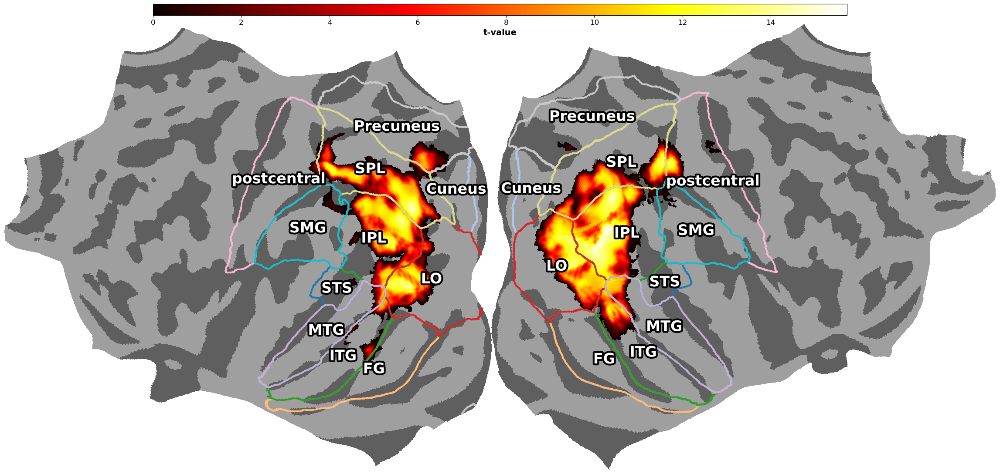


Done! Saved figure to: /tmp/tmap_flatmap_aparc_rois_short_labels.png
Saved ROI summary to: /tmp/nonzero_aparc_roi_summary.csv


In [30]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# ============================================================
# Setup
# ============================================================
plt.close("all")
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th9.5_cluster100.nii.gz"

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

out_fig = "/tmp/tmap_flatmap_aparc_rois_short_labels.png"
out_csv = "/tmp/nonzero_aparc_roi_summary.csv"


# ============================================================
# Parameters
# ============================================================
t_threshold = 0.01
draw_labels = True
draw_colorbar = True

exclude_rois = {
    "unknown",
    "corpuscallosum"
}

label_map = {
    "bankssts": "STS",
    "superiortemporal": "STG",
    "middletemporal": "MTG",
    "inferiortemporal": "ITG",
    "inferiorparietal": "IPL",
    "supramarginal": "SMG",
    "fusiform": "FG",
    "lateraloccipital": "LO",
    "lingual": "LG",
    "cuneus": "Cuneus",
    "pericalcarine": "V1",
    "parahippocampal": "PHG",
    "precuneus": "Precuneus",
    "superiorparietal": "SPL"
}


# ============================================================
# Load t-map and project to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < t_threshold] = np.nan

vmax = np.nanmax(texture)


# ============================================================
# Make pycortex flatmap
# ============================================================
vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=vmax
)

fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]


# ============================================================
# Load flat surface
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load FreeSurfer aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])


# ============================================================
# ROI colors
# ============================================================
cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Find ROIs overlapping nonzero t-map values
# ============================================================
roi_summary = []
roi_masks = {}

for aparc_name in all_rois:

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        continue

    roi_vals = texture[mask]
    valid_vals = roi_vals[~np.isnan(roi_vals)]

    if len(valid_vals) == 0:
        continue

    n_sig = len(valid_vals)
    n_total = mask.sum()

    roi_summary.append({
        "roi_full_name": aparc_name,
        "roi_short_name": label_map.get(aparc_name, aparc_name),
        "n_total_vertices": n_total,
        "n_nonzero_vertices": n_sig,
        "percent_nonzero": n_sig / n_total * 100,
        "max_t": np.nanmax(valid_vals),
        "mean_t": np.nanmean(valid_vals)
    })

    roi_masks[aparc_name] = mask


roi_df = pd.DataFrame(roi_summary).sort_values(
    by="percent_nonzero",
    ascending=False
)

print("\nROIs containing nonzero t-map values:")
print(roi_df.to_string(index=False))

print("\nShort-name mapping:")
for _, row in roi_df.iterrows():
    print(f"{row['roi_short_name']:12s} = {row['roi_full_name']}")

roi_df.to_csv(out_csv, index=False)


# ============================================================
# Plot ROIs and short labels directly on each hemisphere
# ============================================================
for aparc_name, mask in roi_masks.items():

    roi_color = roi_colors[aparc_name]

    boundary_lines = []

    for tri in flat_polys:
        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:
            for i in range(3):
                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        continue

    lc_new = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=3.0,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc_new)

    if draw_labels:

        mask_lh = mask.copy()
        mask_lh[n_lh:] = False

        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask in [mask_lh, mask_rh]:

            if hemi_mask.sum() == 0:
                continue

            # Center of the full ROI
            roi_pts = flat_pts[hemi_mask]

            cx = roi_pts[:, 0].mean()
            cy = roi_pts[:, 1].mean()

            label_text = label_map.get(
                aparc_name,
                aparc_name.replace("_", " ")
            )

            ax.text(
                cx,
                cy,
                label_text,
                color="white",
                fontsize=24,
                fontweight="bold",
                ha="center",
                va="center",
                zorder=20,
                path_effects=[
                    pe.withStroke(
                        linewidth=6,
                        foreground="black"
                    )
                ]
            )

    print(f"Added {label_map.get(aparc_name, aparc_name)} = {aparc_name}")


# ============================================================
# Colorbar
# ============================================================
if draw_colorbar:

    brain_ax_pos = ax.get_position()

    cbar_ax = fig.add_axes([
        brain_ax_pos.x0 + 0.15,
        brain_ax_pos.y1 + 0.02,
        brain_ax_pos.width - 0.30,
        0.025
    ])

    norm = mcolors.Normalize(
        vmin=0,
        vmax=vmax
    )

    sm = cm.ScalarMappable(
        cmap="hot",
        norm=norm
    )

    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        cax=cbar_ax,
        orientation="horizontal"
    )

    cbar.set_label(
        "t-value",
        fontsize=14,
        fontweight="bold"
    )

    cbar.ax.tick_params(labelsize=12)


# ============================================================
# Save and show
# ============================================================
fig.savefig(
    out_fig,
    dpi=600,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print(f"\nDone! Saved figure to: {out_fig}")
print(f"Saved ROI summary to: {out_csv}")

## VA

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

ROIs with nonzero t-map values:
             roi  n_total_vertices  n_nonzero_vertices  percent_nonzero    max_t   mean_t
lateraloccipital             12342                3963        32.109869 7.173535 3.775863
  middletemporal              9509                1853        19.486802 7.222144 3.602975
inferiorparietal             17547                2963        16.886077 6.959937 2.142661
inferiortemporal              8613                1233        14.315569 5.423215 2.267576
        fusiform              9375                 966        10.304000 3.824287 0.955977
        bankssts              4333                 390         9.000692 4.227349 0.886614
   supramarginal             16750                 248         1.480597 2.649062 1.054854
         lingual              8099                   1         0.012347 0.025283 0.025283

Saved ROI summary to: /tmp/tmap_nonzero_aparc_roi_summary.csv
Added bankssts
Adde

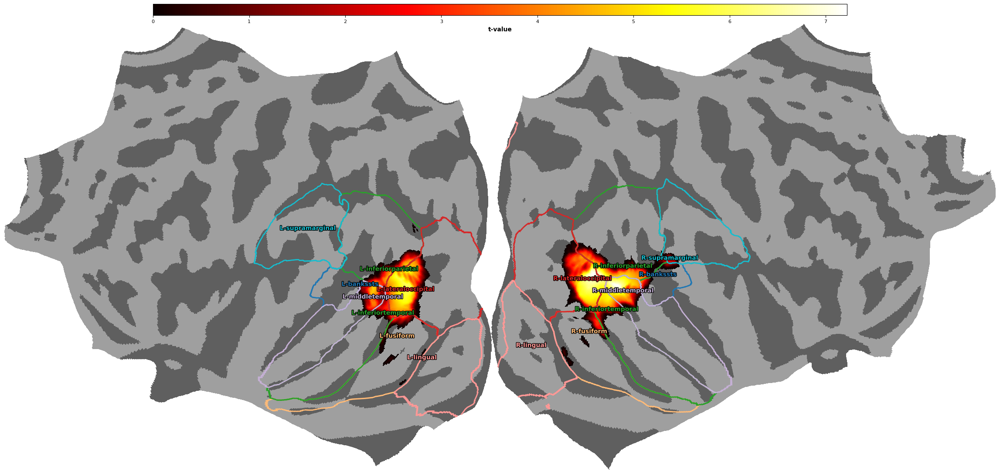


Done! Saved figure to: /tmp/tmap_flatmap_nonzero_aparc_rois.png


In [9]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# ============================================================
# Setup
# ============================================================
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"
fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

out_fig = "/tmp/tmap_flatmap_nonzero_aparc_rois.png"
out_csv = "/tmp/tmap_nonzero_aparc_roi_summary.csv"

t_threshold = 0.01

exclude_rois = {
    "unknown",
    "corpuscallosum"
}


# ============================================================
# Load tmap and project to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])

# Set near-zero values to NaN
texture[np.abs(texture) < t_threshold] = np.nan

vmax = np.nanmax(texture)


# ============================================================
# Make pycortex flatmap
# ============================================================
vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=vmax
)

fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]


# ============================================================
# Get flat surface coordinates
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [
    n.decode() if isinstance(n, bytes) else n
    for n in names_lh
]

names_rh = [
    n.decode() if isinstance(n, bytes) else n
    for n in names_rh
]

labels_all = np.hstack([labels_lh, labels_rh])


# ============================================================
# Use ALL aparc ROIs
# ============================================================
all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])

cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Find ROIs that overlap nonzero tmap values
# ============================================================
roi_masks = {}
roi_summary = []

for aparc_name in all_rois:

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        continue

    roi_vals = texture[mask]
    valid_vals = roi_vals[~np.isnan(roi_vals)]

    # Skip ROI if no nonzero tmap value
    if len(valid_vals) == 0:
        continue

    n_total = mask.sum()
    n_nonzero = len(valid_vals)
    percent_nonzero = n_nonzero / n_total * 100

    roi_masks[aparc_name] = mask

    roi_summary.append({
        "roi": aparc_name,
        "n_total_vertices": n_total,
        "n_nonzero_vertices": n_nonzero,
        "percent_nonzero": percent_nonzero,
        "max_t": np.nanmax(valid_vals),
        "mean_t": np.nanmean(valid_vals)
    })


roi_df = pd.DataFrame(roi_summary)

roi_df = roi_df.sort_values(
    by="percent_nonzero",
    ascending=False
)

print("\nROIs with nonzero t-map values:")
print(roi_df.to_string(index=False))

roi_df.to_csv(out_csv, index=False)
print(f"\nSaved ROI summary to: {out_csv}")


# ============================================================
# Plot only those ROIs
# ============================================================
for aparc_name, mask in roi_masks.items():

    roi_color = roi_colors[aparc_name]

    boundary_lines = []

    for tri in flat_polys:

        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:

            for i in range(3):

                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        print(f"{aparc_name}: no boundary lines found")
        continue

    lc = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=1.8,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc)

    # Label each hemisphere separately
    mask_lh = mask.copy()
    mask_lh[n_lh:] = False

    mask_rh = mask.copy()
    mask_rh[:n_lh] = False

    for hemi_mask, hemi_prefix in [(mask_lh, "L"), (mask_rh, "R")]:

        if hemi_mask.sum() == 0:
            continue

        # Put label near significant vertices if possible
        sig_mask = hemi_mask & ~np.isnan(texture)

        if sig_mask.sum() > 0:
            roi_pts = flat_pts[sig_mask]
        else:
            roi_pts = flat_pts[hemi_mask]

        cx = roi_pts[:, 0].mean()
        cy = roi_pts[:, 1].mean()

        ax.text(
            cx,
            cy,
            f"{hemi_prefix}-{aparc_name}",
            color=roi_color,
            fontsize=10,
            fontweight="bold",
            ha="center",
            va="center",
            zorder=6,
            path_effects=[
                pe.withStroke(
                    linewidth=2,
                    foreground="black"
                )
            ]
        )

    print(f"Added {aparc_name}")


# ============================================================
# Optional colorbar
# ============================================================
brain_ax_pos = ax.get_position()

cbar_ax = fig.add_axes([
    brain_ax_pos.x0 + 0.15,
    brain_ax_pos.y1 + 0.02,
    brain_ax_pos.width - 0.30,
    0.025
])

norm = mcolors.Normalize(vmin=0, vmax=vmax)

sm = cm.ScalarMappable(
    cmap="hot",
    norm=norm
)

sm.set_array([])

cbar = fig.colorbar(
    sm,
    cax=cbar_ax,
    orientation="horizontal"
)

cbar.set_label(
    "t-value",
    fontsize=10,
    fontweight="bold"
)

cbar.ax.tick_params(labelsize=8)


# ============================================================
# Save and show
# ============================================================
fig.savefig(
    out_fig,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(f"\nDone! Saved figure to: {out_fig}")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

ROIs with nonzero behavioral t-map values:
   roi_full_name roi_short_name  n_total_vertices  n_nonzero_vertices  percent_nonzero    max_t   mean_t
lateraloccipital             LO             12342                3963        32.109869 7.173535 3.775863
  middletemporal            MTG              9509                1853        19.486802 7.222144 3.602975
inferiorparietal            IPL             17547                2963        16.886077 6.959937 2.142661
inferiortemporal            ITG              8613                1233        14.315569 5.423215 2.267576
        fusiform             FG              9375                 966        10.304000 3.824287 0.955977
        bankssts            STS              4333                 390         9.000692 4.227349 0.886614
   supramarginal            SMG             16750                 248         1.480597 2.649062 1.054854
         lingual             LG          

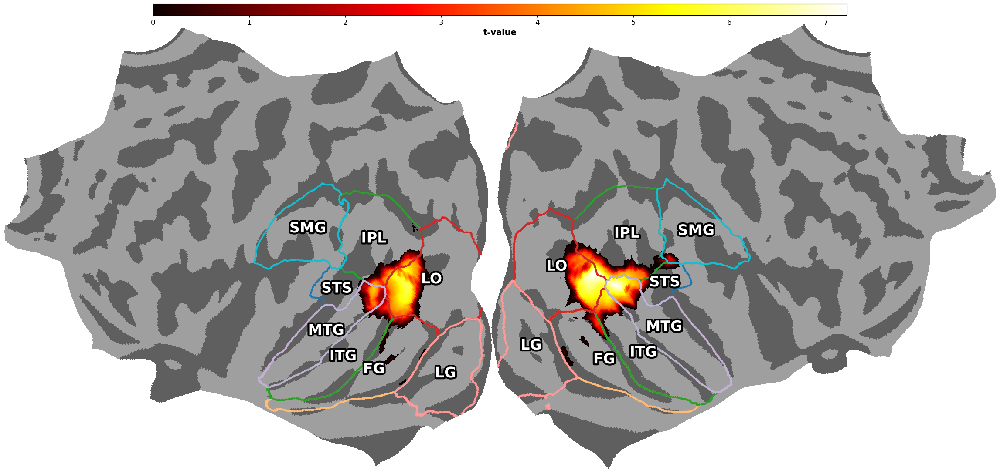


Done! Saved figure to: /tmp/beh60_flatmap_aparc_rois_short_labels.png
Saved ROI summary to: /tmp/beh60_aparc_roi_summary.csv


In [31]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors


# ============================================================
# Setup
# ============================================================
plt.close("all")
cortex.database.db = cortex.database.Database()

tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"
fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

out_fig = "/tmp/beh60_flatmap_aparc_rois_short_labels.png"
out_csv = "/tmp/beh60_aparc_roi_summary.csv"

t_threshold = 0.01
draw_labels = True
draw_colorbar = True

exclude_rois = {"unknown", "corpuscallosum"}

label_map = {
    "bankssts": "STS",
    "superiortemporal": "STG",
    "middletemporal": "MTG",
    "inferiortemporal": "ITG",
    "inferiorparietal": "IPL",
    "supramarginal": "SMG",
    "fusiform": "FG",
    "lateraloccipital": "LO",
    "lingual": "LG",
    "cuneus": "Cuneus",
    "pericalcarine": "V1",
    "parahippocampal": "PHG",
    "precuneus": "Precuneus",
    "superiorparietal": "SPL",
    "posteriorcingulate": "PCC",
    "isthmuscingulate": "ICC",
    "medialorbitofrontal": "mOFC",
    "lateralorbitofrontal": "lOFC",
    "superiorfrontal": "SFG",
    "rostralmiddlefrontal": "rMFG",
    "caudalmiddlefrontal": "cMFG",
    "precentral": "PreCG",
    "postcentral": "PostCG",
    "insula": "Insula",
    "temporalpole": "TP",
    "frontalpole": "FP",
    "paracentral": "ParaC",
    "entorhinal": "Ent"
}


# ============================================================
# Load t-map and project to fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < t_threshold] = np.nan

vmax = np.nanmax(texture)


# ============================================================
# Make pycortex flatmap
# ============================================================
vertex_data = cortex.Vertex(
    texture,
    "fsaverage",
    cmap="hot",
    vmin=0,
    vmax=vmax
)

fig = cortex.quickflat.make_figure(
    vertex_data,
    with_curvature=True,
    with_colorbar=False,
    with_rois=False,
    with_sulci=False,
    with_labels=False,
    curvature_brightness=0.5,
    curvature_contrast=0.25,
    height=1024
)

ax = fig.axes[0]


# ============================================================
# Load flat surface
# ============================================================
flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load FreeSurfer aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])


# ============================================================
# ROI colors
# ============================================================
cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Find ROIs overlapping behavioral t-map
# ============================================================
roi_masks = {}
roi_summary = []

for aparc_name in all_rois:

    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    if mask.sum() == 0:
        continue

    roi_vals = texture[mask]
    valid_vals = roi_vals[~np.isnan(roi_vals)]

    if len(valid_vals) == 0:
        continue

    n_total = mask.sum()
    n_nonzero = len(valid_vals)

    roi_masks[aparc_name] = mask

    roi_summary.append({
        "roi_full_name": aparc_name,
        "roi_short_name": label_map.get(aparc_name, aparc_name),
        "n_total_vertices": n_total,
        "n_nonzero_vertices": n_nonzero,
        "percent_nonzero": n_nonzero / n_total * 100,
        "max_t": np.nanmax(valid_vals),
        "mean_t": np.nanmean(valid_vals)
    })


roi_df = pd.DataFrame(roi_summary).sort_values(
    by="percent_nonzero",
    ascending=False
)

print("\nROIs with nonzero behavioral t-map values:")
print(roi_df.to_string(index=False))

print("\nShort-name mapping:")
for _, row in roi_df.iterrows():
    print(f"{row['roi_short_name']:12s} = {row['roi_full_name']}")

roi_df.to_csv(out_csv, index=False)
print(f"\nSaved ROI summary to: {out_csv}")


# ============================================================
# Plot ROIs and centered short labels on both hemispheres
# ============================================================
for aparc_name, mask in roi_masks.items():

    roi_color = roi_colors[aparc_name]

    boundary_lines = []

    for tri in flat_polys:
        in_roi = mask[tri]

        if 0 < in_roi.sum() < 3:
            for i in range(3):
                v1 = tri[i]
                v2 = tri[(i + 1) % 3]

                if mask[v1] != mask[v2]:
                    boundary_lines.append([
                        flat_pts[v1, :2],
                        flat_pts[v2, :2]
                    ])

    if len(boundary_lines) == 0:
        print(f"{aparc_name}: no boundary lines found")
        continue

    lc_new = LineCollection(
        boundary_lines,
        colors=[roi_color],
        linewidths=3.0,
        alpha=1.0,
        zorder=5
    )

    ax.add_collection(lc_new)

    if draw_labels:

        mask_lh = mask.copy()
        mask_lh[n_lh:] = False

        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask in [mask_lh, mask_rh]:

            if hemi_mask.sum() == 0:
                continue

            # Center of full anatomical ROI
            roi_pts = flat_pts[hemi_mask]

            cx = roi_pts[:, 0].mean()
            cy = roi_pts[:, 1].mean()

            label_text = label_map.get(
                aparc_name,
                aparc_name.replace("_", " ")
            )

            ax.text(
                cx,
                cy,
                label_text,
                color="white",
                fontsize=24,
                fontweight="bold",
                ha="center",
                va="center",
                zorder=20,
                path_effects=[
                    pe.withStroke(
                        linewidth=6,
                        foreground="black"
                    )
                ]
            )

    print(f"Added {label_map.get(aparc_name, aparc_name)} = {aparc_name}")


# ============================================================
# Colorbar
# ============================================================
if draw_colorbar:

    brain_ax_pos = ax.get_position()

    cbar_ax = fig.add_axes([
        brain_ax_pos.x0 + 0.15,
        brain_ax_pos.y1 + 0.02,
        brain_ax_pos.width - 0.30,
        0.025
    ])

    norm = mcolors.Normalize(
        vmin=0,
        vmax=vmax
    )

    sm = cm.ScalarMappable(
        cmap="hot",
        norm=norm
    )

    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        cax=cbar_ax,
        orientation="horizontal"
    )

    cbar.set_label(
        "t-value",
        fontsize=14,
        fontweight="bold"
    )

    cbar.ax.tick_params(labelsize=12)


# ============================================================
# Save and show
# ============================================================
fig.savefig(
    out_fig,
    dpi=600,
    bbox_inches="tight",
    facecolor="white"
)

plt.show()

print(f"\nDone! Saved figure to: {out_fig}")
print(f"Saved ROI summary to: {out_csv}")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

Same ROI set used for BOTH CLIP-ViT and VA plots:
STS          = bankssts                  | CLIP=True | VA=True
Cuneus       = cuneus                    | CLIP=True | VA=False
FG           = fusiform                  | CLIP=True | VA=True
IPL          = inferiorparietal          | CLIP=True | VA=True
ITG          = inferiortemporal          | CLIP=True | VA=True
LO           = lateraloccipital          | CLIP=True | VA=True
LG           = lingual                   | CLIP=False | VA=True
MTG          = middletemporal            | CLIP=True | VA=True
Postcentral  = postcentral               | CLIP=True | VA=False
Precuneus    = precuneus                 | CLIP=True | VA=False
SPL          = superiorparietal          | CLIP=True | VA=False
SMG          = supramarginal             | CLIP=True | VA=True

Saved ROI summary to: /tmp/clipvit_va_union_roi_summary.csv
Saved: /tmp/clipvit_same_rois.png
Saved: /tmp/va_sam

/home/yujun/miniconda3/envs/pycortex/lib/python3.11/site-packages/PIL/Image.py:3451: DecompressionBombWarning: Image size (95109240 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(



Saved combined vertical figure to: /tmp/clipvit_va_same_rois_vertical.png


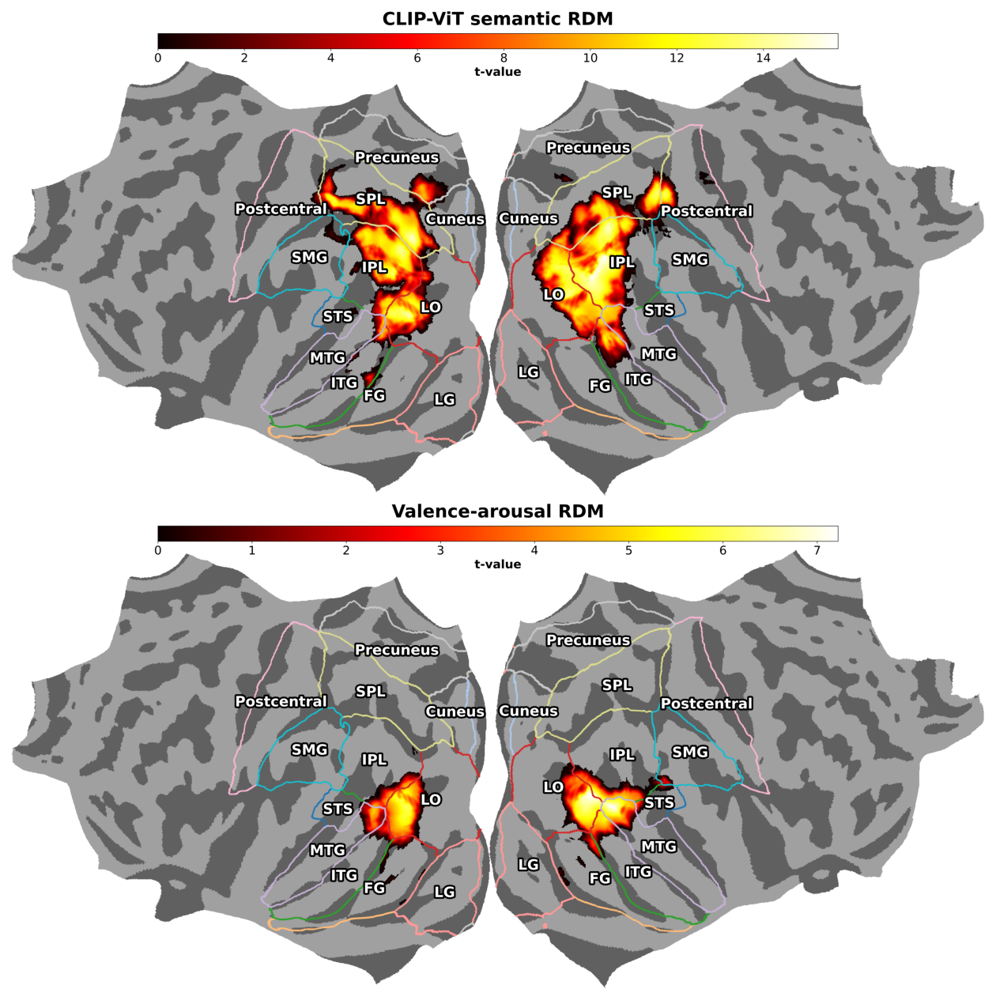

In [40]:
import os
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from PIL import Image


# ============================================================
# Setup
# ============================================================
plt.close("all")
cortex.database.db = cortex.database.Database()

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

clip_tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th9.5_cluster100.nii.gz"

va_tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"

out_dir = "/tmp"

out_clip_fig = os.path.join(out_dir, "clipvit_same_rois.png")
out_va_fig = os.path.join(out_dir, "va_same_rois.png")
out_combined_fig = os.path.join(out_dir, "clipvit_va_same_rois_vertical.png")
out_csv = os.path.join(out_dir, "clipvit_va_union_roi_summary.csv")

t_threshold = 0.01

exclude_rois = {
    "unknown",
    "corpuscallosum"
}

label_map = {
    "bankssts": "STS",
    "superiortemporal": "STG",
    "middletemporal": "MTG",
    "inferiortemporal": "ITG",
    "inferiorparietal": "IPL",
    "supramarginal": "SMG",
    "fusiform": "FG",
    "lateraloccipital": "LO",
    "lingual": "LG",
    "cuneus": "Cuneus",
    "pericalcarine": "V1",
    "parahippocampal": "PHG",
    "precuneus": "Precuneus",
    "superiorparietal": "SPL",
    "posteriorcingulate": "PCC",
    "postcentral": "Postcentral",
    "precentral": "precentral",
    "insula": "Insula",
    "superiorfrontal": "SFG",
    "rostralmiddlefrontal": "rMFG",
    "caudalmiddlefrontal": "cMFG",
    "medialorbitofrontal": "mOFC",
    "lateralorbitofrontal": "lOFC",
    "paracentral": "ParaC",
    "temporalpole": "TP",
    "frontalpole": "FP",
    "entorhinal": "Ent"
}


# ============================================================
# Load fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])

cmap = plt.get_cmap("tab20", len(all_rois))

roi_colors = {
    roi: cmap(i)
    for i, roi in enumerate(all_rois)
}


# ============================================================
# Helper functions
# ============================================================
def load_texture(tmap_path, threshold=0.01):
    tex_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
    tex_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

    tex = np.hstack([tex_l, tex_r])
    tex[np.abs(tex) < threshold] = np.nan

    return tex


def get_roi_mask(aparc_name):
    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    return mask


def get_active_rois(texture):
    active = {}

    for aparc_name in all_rois:
        mask = get_roi_mask(aparc_name)

        if mask.sum() == 0:
            continue

        vals = texture[mask]
        vals = vals[~np.isnan(vals)]

        if len(vals) == 0:
            continue

        active[aparc_name] = {
            "mask": mask,
            "n_nonzero_vertices": len(vals),
            "percent_nonzero": len(vals) / mask.sum() * 100,
            "max_t": np.nanmax(vals),
            "mean_t": np.nanmean(vals)
        }

    return active


def add_roi_boundaries_and_labels(ax, roi_set):

    for aparc_name in roi_set:

        mask = get_roi_mask(aparc_name)
        roi_color = roi_colors[aparc_name]

        boundary_lines = []

        for tri in flat_polys:
            in_roi = mask[tri]

            if 0 < in_roi.sum() < 3:
                for i in range(3):
                    v1 = tri[i]
                    v2 = tri[(i + 1) % 3]

                    if mask[v1] != mask[v2]:
                        boundary_lines.append([
                            flat_pts[v1, :2],
                            flat_pts[v2, :2]
                        ])

        if len(boundary_lines) > 0:

            lc_new = LineCollection(
                boundary_lines,
                colors=[roi_color],
                linewidths=3.0,
                alpha=1.0,
                zorder=5
            )

            ax.add_collection(lc_new)

        mask_lh = mask.copy()
        mask_lh[n_lh:] = False

        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask in [mask_lh, mask_rh]:

            if hemi_mask.sum() == 0:
                continue

            # label in the center of full anatomical ROI
            roi_pts = flat_pts[hemi_mask]

            cx = roi_pts[:, 0].mean()
            cy = roi_pts[:, 1].mean()

            label_text = label_map.get(
                aparc_name,
                aparc_name.replace("_", " ")
            )

            ax.text(
                cx,
                cy,
                label_text,
                color="white",
                fontsize=24,
                fontweight="bold",
                ha="center",
                va="center",
                zorder=20,
                path_effects=[
                    pe.withStroke(
                        linewidth=6,
                        foreground="black"
                    )
                ]
            )


def plot_flatmap(texture, roi_set, title, out_fig):

    vmax = np.nanmax(texture)

    vertex_data = cortex.Vertex(
        texture,
        "fsaverage",
        cmap="hot",
        vmin=0,
        vmax=vmax
    )

    fig = cortex.quickflat.make_figure(
        vertex_data,
        with_curvature=True,
        with_colorbar=False,
        with_rois=False,
        with_sulci=False,
        with_labels=False,
        curvature_brightness=0.5,
        curvature_contrast=0.25,
        height=1024
    )

    ax = fig.axes[0]

    add_roi_boundaries_and_labels(ax, roi_set)

    ax.set_title(
        title,
        fontsize=30,
        fontweight="bold",
        pad=55
    )

    brain_ax_pos = ax.get_position()

    cbar_ax = fig.add_axes([
        brain_ax_pos.x0 + 0.15,
        brain_ax_pos.y1 + 0.02,
        brain_ax_pos.width - 0.30,
        0.035
    ])
    
    norm = mcolors.Normalize(
        vmin=0,
        vmax=vmax
    )

    sm = cm.ScalarMappable(
        cmap="hot",
        norm=norm
    )

    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        cax=cbar_ax,
        orientation="horizontal"
    )

    cbar.set_label(
        "t-value",
        fontsize=20,
        fontweight="bold"
    )

    cbar.ax.tick_params(labelsize=20)

    fig.savefig(
        out_fig,
        dpi=600,
        bbox_inches="tight",
        facecolor="white"
    )

    plt.close(fig)

    print(f"Saved: {out_fig}")


# ============================================================
# Load both maps
# ============================================================
texture_clip = load_texture(clip_tmap_path, threshold=t_threshold)
texture_va = load_texture(va_tmap_path, threshold=t_threshold)


# ============================================================
# Find active ROIs in each map
# ============================================================
clip_rois = get_active_rois(texture_clip)
va_rois = get_active_rois(texture_va)

clip_roi_set = set(clip_rois.keys())
va_roi_set = set(va_rois.keys())

# Same ROI set shown in both plots
union_roi_set = sorted(clip_roi_set | va_roi_set)


# ============================================================
# Print ROI summary
# ============================================================
summary_rows = []

for roi in union_roi_set:
    summary_rows.append({
        "roi_full_name": roi,
        "roi_short_name": label_map.get(roi, roi),
        "in_clipvit": roi in clip_roi_set,
        "in_va": roi in va_roi_set,
        "clipvit_percent_nonzero": clip_rois.get(roi, {}).get("percent_nonzero", 0),
        "va_percent_nonzero": va_rois.get(roi, {}).get("percent_nonzero", 0),
        "clipvit_max_t": clip_rois.get(roi, {}).get("max_t", np.nan),
        "va_max_t": va_rois.get(roi, {}).get("max_t", np.nan)
    })

summary_df = pd.DataFrame(summary_rows)

summary_df.to_csv(out_csv, index=False)

print("\nSame ROI set used for BOTH CLIP-ViT and VA plots:")
for _, row in summary_df.iterrows():
    print(
        f"{row['roi_short_name']:12s} = {row['roi_full_name']:25s} "
        f"| CLIP={row['in_clipvit']} | VA={row['in_va']}"
    )

print(f"\nSaved ROI summary to: {out_csv}")


# ============================================================
# Plot individual flatmaps with same ROI set
# ============================================================
plot_flatmap(
    texture_clip,
    union_roi_set,
    "CLIP-ViT semantic RDM",
    out_clip_fig
)

plot_flatmap(
    texture_va,
    union_roi_set,
    "Valence-arousal RDM",
    out_va_fig
)


# ============================================================
# Stack two saved figures vertically
# ============================================================
img_clip = Image.open(out_clip_fig).convert("RGB")
img_va = Image.open(out_va_fig).convert("RGB")

max_width = max(img_clip.width, img_va.width)

def pad_to_width(img, width):
    if img.width == width:
        return img

    new_img = Image.new("RGB", (width, img.height), "white")
    x_offset = (width - img.width) // 2
    new_img.paste(img, (x_offset, 0))
    return new_img

img_clip = pad_to_width(img_clip, max_width)
img_va = pad_to_width(img_va, max_width)

combined_height = img_clip.height + img_va.height

combined = Image.new(
    "RGB",
    (max_width, combined_height),
    "white"
)

combined.paste(img_clip, (0, 0))
combined.paste(img_va, (0, img_clip.height))

combined.save(out_combined_fig, dpi=(600, 600))

print(f"\nSaved combined vertical figure to: {out_combined_fig}")


# ============================================================
# Display combined figure
# ============================================================
plt.figure(figsize=(16, 24))
plt.imshow(mpimg.imread(out_combined_fig))
plt.axis("off")
plt.show()

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage

Same ROI set used for BOTH CLIP-ViT and VA plots:
STS          = bankssts                  | CLIP=True | VA=True
Cuneus       = cuneus                    | CLIP=True | VA=False
FG           = fusiform                  | CLIP=True | VA=True
IPL          = inferiorparietal          | CLIP=True | VA=True
ITG          = inferiortemporal          | CLIP=True | VA=True
LO           = lateraloccipital          | CLIP=True | VA=True
LG           = lingual                   | CLIP=False | VA=True
MTG          = middletemporal            | CLIP=True | VA=True
Postcentral  = postcentral               | CLIP=True | VA=False
Precuneus    = precuneus                 | CLIP=True | VA=False
SPL          = superiorparietal          | CLIP=True | VA=False
SMG          = supramarginal             | CLIP=True | VA=True

Saved ROI summary to: /tmp/clipvit_va_union_roi_summary.csv
Saved: /tmp/clipvit_same_rois.png
Saved: /tmp/va_sam

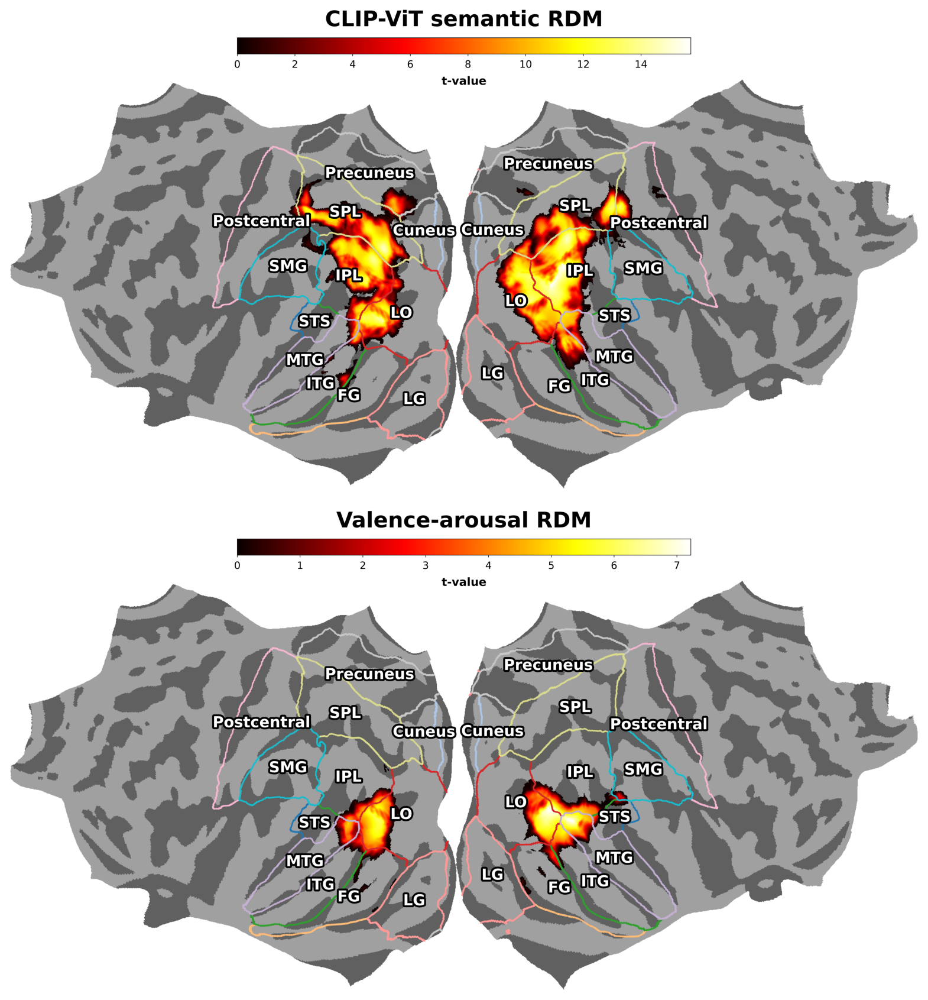

In [44]:
import os
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from PIL import Image


# ============================================================
# Setup
# ============================================================
plt.close("all")
cortex.database.db = cortex.database.Database()

fs_subj = "/usr/local/freesurfer/7.4.1/subjects/fsaverage"

clip_tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/tmap_clipvit_p001_fisherz_fdr001_th9.5_cluster100.nii.gz"
va_tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"

out_dir = "/tmp"
out_clip_fig = os.path.join(out_dir, "clipvit_same_rois.png")
out_va_fig = os.path.join(out_dir, "va_same_rois.png")
out_combined_fig = os.path.join(out_dir, "clipvit_va_same_rois_vertical.png")
out_csv = os.path.join(out_dir, "clipvit_va_union_roi_summary.csv")

t_threshold = 0.01

exclude_rois = {
    "unknown",
    "corpuscallosum"
}

label_map = {
    "bankssts": "STS",
    "superiortemporal": "STG",
    "middletemporal": "MTG",
    "inferiortemporal": "ITG",
    "inferiorparietal": "IPL",
    "supramarginal": "SMG",
    "fusiform": "FG",
    "lateraloccipital": "LO",
    "lingual": "LG",
    "cuneus": "Cuneus",
    "pericalcarine": "V1",
    "parahippocampal": "PHG",
    "precuneus": "Precuneus",
    "superiorparietal": "SPL",
    "posteriorcingulate": "PCC",
    "postcentral": "Postcentral",
    "precentral": "Precentral",
    "insula": "Insula",
    "superiorfrontal": "SFG",
    "rostralmiddlefrontal": "rMFG",
    "caudalmiddlefrontal": "cMFG",
    "medialorbitofrontal": "mOFC",
    "lateralorbitofrontal": "lOFC",
    "paracentral": "ParaC",
    "temporalpole": "TP",
    "frontalpole": "FP",
    "entorhinal": "Ent"
}


# ============================================================
# Load fsaverage surface
# ============================================================
fsaverage_ni = datasets.fetch_surf_fsaverage("fsaverage")

flat_pts, flat_polys = cortex.db.get_surf(
    "fsaverage",
    "flat",
    merge=True,
    nudge=True
)

n_lh = cortex.db.get_surf(
    "fsaverage",
    "flat",
    "lh"
)[0].shape[0]


# ============================================================
# Load aparc annotations
# ============================================================
labels_lh, _, names_lh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/lh.aparc.annot"
)

labels_rh, _, names_rh = nib.freesurfer.read_annot(
    f"{fs_subj}/label/rh.aparc.annot"
)

names_lh = [n.decode() if isinstance(n, bytes) else n for n in names_lh]
names_rh = [n.decode() if isinstance(n, bytes) else n for n in names_rh]

labels_all = np.hstack([labels_lh, labels_rh])

all_rois = sorted([
    roi for roi in names_lh
    if roi not in exclude_rois
])

cmap = plt.get_cmap("tab20", len(all_rois))
roi_colors = {roi: cmap(i) for i, roi in enumerate(all_rois)}


# ============================================================
# Helper functions
# ============================================================
def load_texture(tmap_path, threshold=0.01):
    tex_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
    tex_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)

    tex = np.hstack([tex_l, tex_r])
    tex[np.abs(tex) < threshold] = np.nan
    return tex


def get_roi_mask(aparc_name):
    mask = np.zeros(len(labels_all), dtype=bool)

    if aparc_name in names_lh:
        idx_lh = names_lh.index(aparc_name)
        mask[:n_lh] = labels_lh == idx_lh

    if aparc_name in names_rh:
        idx_rh = names_rh.index(aparc_name)
        mask[n_lh:] = labels_rh == idx_rh

    return mask


def get_active_rois(texture):
    active = {}

    for aparc_name in all_rois:
        mask = get_roi_mask(aparc_name)

        if mask.sum() == 0:
            continue

        vals = texture[mask]
        vals = vals[~np.isnan(vals)]

        if len(vals) == 0:
            continue

        active[aparc_name] = {
            "mask": mask,
            "n_nonzero_vertices": len(vals),
            "percent_nonzero": len(vals) / mask.sum() * 100,
            "max_t": np.nanmax(vals),
            "mean_t": np.nanmean(vals)
        }

    return active


def add_roi_boundaries_and_labels(ax, roi_set):

    for aparc_name in roi_set:

        mask = get_roi_mask(aparc_name)
        roi_color = roi_colors[aparc_name]

        boundary_lines = []

        for tri in flat_polys:
            in_roi = mask[tri]

            if 0 < in_roi.sum() < 3:
                for i in range(3):
                    v1 = tri[i]
                    v2 = tri[(i + 1) % 3]

                    if mask[v1] != mask[v2]:
                        boundary_lines.append([
                            flat_pts[v1, :2],
                            flat_pts[v2, :2]
                        ])

        if len(boundary_lines) > 0:
            lc_new = LineCollection(
                boundary_lines,
                colors=[roi_color],
                linewidths=3.0,
                alpha=1.0,
                zorder=5
            )
            ax.add_collection(lc_new)

        mask_lh = mask.copy()
        mask_lh[n_lh:] = False

        mask_rh = mask.copy()
        mask_rh[:n_lh] = False

        for hemi_mask in [mask_lh, mask_rh]:

            if hemi_mask.sum() == 0:
                continue

            # Label in the center of the full anatomical ROI
            roi_pts = flat_pts[hemi_mask]
            cx = roi_pts[:, 0].mean()
            cy = roi_pts[:, 1].mean()

            label_text = label_map.get(
                aparc_name,
                aparc_name.replace("_", " ")
            )

            ax.text(
                cx,
                cy,
                label_text,
                color="white",
                fontsize=24,
                fontweight="bold",
                ha="center",
                va="center",
                zorder=20,
                path_effects=[
                    pe.withStroke(
                        linewidth=6,
                        foreground="black"
                    )
                ]
            )


def plot_flatmap(texture, roi_set, title, out_fig):

    vmax = np.nanmax(texture)

    vertex_data = cortex.Vertex(
        texture,
        "fsaverage",
        cmap="hot",
        vmin=0,
        vmax=vmax
    )

    fig = cortex.quickflat.make_figure(
        vertex_data,
        with_curvature=True,
        with_colorbar=False,
        with_rois=False,
        with_sulci=False,
        with_labels=False,
        curvature_brightness=0.5,
        curvature_contrast=0.25,
        height=1024
    )

    ax = fig.axes[0]

    # Move brain downward and slightly shrink it to create space above
    pos = ax.get_position()
    ax.set_position([
        pos.x0,
        pos.y0 - 0.045,
        pos.width,
        pos.height * 0.88
    ])

    add_roi_boundaries_and_labels(ax, roi_set)

    # Fixed title position
    fig.text(
        0.5,
        0.985,
        title,
        ha="center",
        va="top",
        fontsize=34,
        fontweight="bold"
    )

    # Fixed colorbar position, with clear gap from title and brain
    cbar_ax = fig.add_axes([
        0.28,   # move inward from left
        0.89,  # same vertical position
        0.44,   # shorter width
        0.035   # thicker height
    ])

    norm = mcolors.Normalize(
        vmin=0,
        vmax=vmax
    )

    sm = cm.ScalarMappable(
        cmap="hot",
        norm=norm
    )

    sm.set_array([])

    cbar = fig.colorbar(
        sm,
        cax=cbar_ax,
        orientation="horizontal"
    )

    cbar.set_label(
        "t-value",
        fontsize=18,
        fontweight="bold",
        labelpad=10
    )

    cbar.ax.tick_params(
        labelsize=16,
        pad=6
    )

    fig.savefig(
        out_fig,
        dpi=600,
        bbox_inches="tight",
        facecolor="white"
    )

    plt.close(fig)
    print(f"Saved: {out_fig}")


# ============================================================
# Load both maps
# ============================================================
texture_clip = load_texture(clip_tmap_path, threshold=t_threshold)
texture_va = load_texture(va_tmap_path, threshold=t_threshold)


# ============================================================
# Find active ROIs in each map
# ============================================================
clip_rois = get_active_rois(texture_clip)
va_rois = get_active_rois(texture_va)

clip_roi_set = set(clip_rois.keys())
va_roi_set = set(va_rois.keys())

# Same ROI set shown in both plots
union_roi_set = sorted(clip_roi_set | va_roi_set)


# ============================================================
# Print ROI summary
# ============================================================
summary_rows = []

for roi in union_roi_set:
    summary_rows.append({
        "roi_full_name": roi,
        "roi_short_name": label_map.get(roi, roi),
        "in_clipvit": roi in clip_roi_set,
        "in_va": roi in va_roi_set,
        "clipvit_percent_nonzero": clip_rois.get(roi, {}).get("percent_nonzero", 0),
        "va_percent_nonzero": va_rois.get(roi, {}).get("percent_nonzero", 0),
        "clipvit_max_t": clip_rois.get(roi, {}).get("max_t", np.nan),
        "va_max_t": va_rois.get(roi, {}).get("max_t", np.nan)
    })

summary_df = pd.DataFrame(summary_rows)
summary_df.to_csv(out_csv, index=False)

print("\nSame ROI set used for BOTH CLIP-ViT and VA plots:")
for _, row in summary_df.iterrows():
    print(
        f"{row['roi_short_name']:12s} = {row['roi_full_name']:25s} "
        f"| CLIP={row['in_clipvit']} | VA={row['in_va']}"
    )

print(f"\nSaved ROI summary to: {out_csv}")


# ============================================================
# Plot individual flatmaps with same ROI set
# ============================================================
plot_flatmap(
    texture_clip,
    union_roi_set,
    "CLIP-ViT semantic RDM",
    out_clip_fig
)

plot_flatmap(
    texture_va,
    union_roi_set,
    "Valence-arousal RDM",
    out_va_fig
)


# ============================================================
# Stack two saved figures vertically with more space between panels
# ============================================================
img_clip = Image.open(out_clip_fig).convert("RGB")
img_va = Image.open(out_va_fig).convert("RGB")

max_width = max(img_clip.width, img_va.width)

def pad_to_width(img, width):
    if img.width == width:
        return img

    new_img = Image.new("RGB", (width, img.height), "white")
    x_offset = (width - img.width) // 2
    new_img.paste(img, (x_offset, 0))
    return new_img

img_clip = pad_to_width(img_clip, max_width)
img_va = pad_to_width(img_va, max_width)

panel_gap = 180

combined_height = img_clip.height + img_va.height + panel_gap

combined = Image.new(
    "RGB",
    (max_width, combined_height),
    "white"
)

combined.paste(img_clip, (0, 0))
combined.paste(img_va, (0, img_clip.height + panel_gap))

combined.save(out_combined_fig, dpi=(600, 600))

print(f"\nSaved combined vertical figure to: {out_combined_fig}")


# ============================================================
# Display combined figure
# ============================================================
plt.figure(figsize=(20, 30))
plt.imshow(mpimg.imread(out_combined_fig))
plt.axis("off")
plt.show()

# fsaverage-fiducial

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage
  Added V1v: 1603 vertices
  Added V1d: 1390 vertices
  Added V2v: 997 vertices
  Added V2d: 1094 vertices
  Added V3v: 795 vertices
  Added V3d: 716 vertices
  Added hV4: 553 vertices
  Added V3a: 871 vertices
  Added V3b: 390 vertices
  Added LO1: 533 vertices
  Added LO2: 116 vertices
  Added VO1: 321 vertices
  Added VO2: 648 vertices
  Added PHC1: 565 vertices
  Added PHC2: 471 vertices
  Added IPS: 1778 vertices


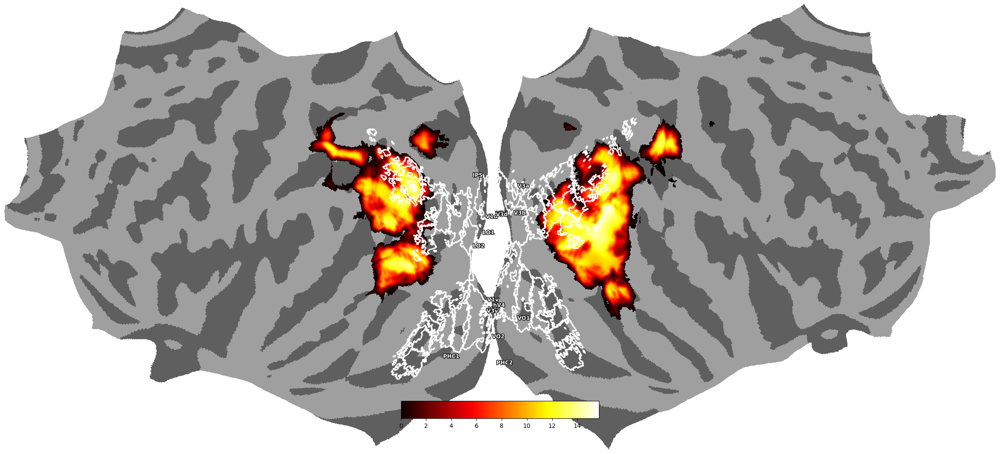

Done!


In [5]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import pickle
import matplotlib.pyplot as plt
from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe

cortex.database.db = cortex.database.Database()

# Load tmap
tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_clipvit_p001_fisherz_fdr01.nii.gz"
fsaverage_ni = datasets.fetch_surf_fsaverage('fsaverage')
texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)
texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < 0.01] = np.nan

vertex_data = cortex.Vertex(texture, 'fsaverage', cmap='hot', vmin=0, vmax=np.nanmax(texture))

fig = cortex.quickflat.make_figure(vertex_data, 
                                    with_curvature=True, 
                                    with_colorbar=True,
                                    with_rois=False,
                                    with_sulci=False,
                                    with_labels=False,
                                    curvature_brightness=0.5,
                                    curvature_contrast=0.25,
                                    height=1024)

# ---- Load Kastner atlas ----
with open('/mnt/n/Experimental_Data/yujunchen/projects/data/masks/kastner_dict.pkl', 'rb') as f:
    roi_masks = pickle.load(f)

# ---- Define ROI groups to display ----
roi_groups = {
    'V1v': ['V1v'],
    'V1d': ['V1d'],
    'V2v': ['V2v'],
    'V2d': ['V2d'],
    'V3v': ['V3v'],
    'V3d': ['V3d'],
    'hV4': ['hV4'],
    'V3a': ['V3a'],
    'V3b': ['V3b'],
    'LO1': ['LO1'],
    'LO2': ['LO2'],
    'VO1': ['VO1'],
    'VO2': ['VO2'],
    'PHC1': ['PHC1'],
    'PHC2': ['PHC2'],
    'IPS': ['IPS'],
}

# ---- Project each ROI to surface and draw boundaries ----
n_lh = cortex.db.get_surf('fsaverage', 'fiducial', 'lh')[0].shape[0]
n_rh = cortex.db.get_surf('fsaverage', 'fiducial', 'rh')[0].shape[0]
n_verts = n_lh + n_rh

flat_pts, flat_polys = cortex.db.get_surf('fsaverage', 'flat', merge=True, nudge=True)
ax = fig.axes[0]

for roi_name, sub_rois in roi_groups.items():
    # Combine sub-ROI masks into one surface mask
    mask = np.zeros(n_verts, dtype=bool)
    
    for sub_roi in sub_rois:
        roi_img = roi_masks[sub_roi]
        # Project volume mask to surface (use nearest interpolation for binary masks)
        surf_l = surface.vol_to_surf(roi_img, fsaverage_ni.pial_left, interpolation='nearest_most_frequent')
        surf_r = surface.vol_to_surf(roi_img, fsaverage_ni.pial_right, interpolation='nearest_most_frequent')
        surf = np.hstack([surf_l, surf_r])
        # Threshold: vol_to_surf with nearest may give fractional values
        mask |= (surf > 0.5)
    
    if mask.sum() == 0:
        print(f"  {roi_name}: no vertices found, skipping")
        continue
    
    # Find boundary edges
    boundary_lines = []
    for tri in flat_polys:
        in_roi = mask[tri]
        if in_roi.sum() > 0 and in_roi.sum() < 3:
            for i in range(3):
                v1, v2 = tri[i], tri[(i+1)%3]
                if mask[v1] != mask[v2]:
                    boundary_lines.append([flat_pts[v1, :2], flat_pts[v2, :2]])
    
    if boundary_lines:
        lc = LineCollection(boundary_lines, colors='white', linewidths=1.5, alpha=0.9)
        ax.add_collection(lc)
        
        # Label at centroid
        roi_pts = flat_pts[mask]
        cx, cy = roi_pts[:, 0].mean(), roi_pts[:, 1].mean()
        ax.text(cx, cy, roi_name, color='white', fontsize=9, fontweight='bold',
                ha='center', va='center',
                path_effects=[pe.withStroke(linewidth=2, foreground='black')])
        print(f"  Added {roi_name}: {mask.sum()} vertices")

fig.savefig('/tmp/tmap_flatmap_kastner.png', dpi=300, bbox_inches='tight')
plt.show()
print("Done!")

In [7]:
# First, find what's actually in your Julian directory
julian_base = r"N:\Experimental_Data\yujunchen\projects\data\masks\Julian2012"

print("Directory contents:")
for root, dirs, files in os.walk(julian_base):
    for f in files:
        if f.endswith(('.img', '.hdr', '.nii', '.nii.gz')):
            print(f"  {os.path.join(root, f)}")

Directory contents:


In [8]:
julian_base = r"N:\Experimental_Data\yujunchen\projects\data\masks\Julian2012"

# Auto-discover all .img files
julian_parcels = {}
category_colors = {
    'FFA': '#FF6B6B', 'OFA': '#FF9999', 'pSTS': '#CC4444', 'STS': '#CC4444',
    'PPA': '#4ECDC4', 'RSC': '#45B7AA', 'TOS': '#2E8B7A',
    'EBA': '#FFD93D',
    'LOC': '#6BCB77', 'LO': '#6BCB77', 'pFs': '#6BCB77',
}

for root, dirs, files in os.walk(julian_base):
    for f in files:
        if f.endswith('.img'):
            name = f.replace('.img', '')  # e.g., 'rEBA', 'lFFA'
            # Match color by checking which key is in the name
            color = 'white'  # default
            for key, c in category_colors.items():
                if key in name:
                    color = c
                    break
            julian_parcels[name] = {
                'path': os.path.join(root, f),
                'color': color,
            }

print(f"Found {len(julian_parcels)} Julian parcels:")
for name, info in julian_parcels.items():
    print(f"  {name}: {info['path']}")

Found 0 Julian parcels:


[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage
Found 14 Julian parcels:
  rFFA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/face_parcels/face_parcels/rFFA.img
  lFFA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/face_parcels/face_parcels/lFFA.img
  rOFA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/face_parcels/face_parcels/rOFA.img
  lOFA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/face_parcels/face_parcels/lOFA.img
  rPPA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/scene_parcels/scene_parcels/rPPA.img
  lPPA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/scene_parcels/scene_parcels/lPPA.img
  rRSC: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/scene_parcels/scene_parcels/rRSC.img
  lRSC: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/scene_parcels/scene_parcels/lRSC.img
  rTOS: /mnt/n/Exper

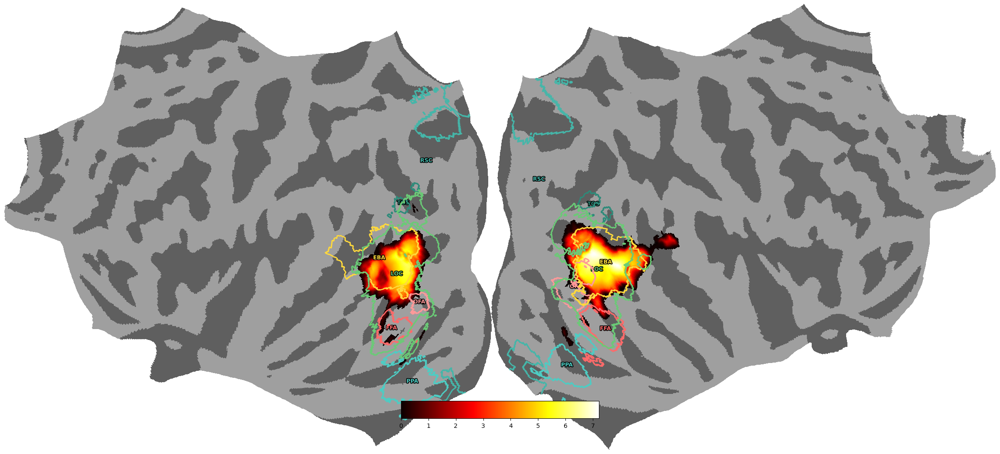

Done!


In [10]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import os
import glob

cortex.database.db = cortex.database.Database()

# Load tmap
tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_beh60_p05_v2.nii.gz"
fsaverage_ni = datasets.fetch_surf_fsaverage('fsaverage')
texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)
texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < 0.01] = np.nan

vertex_data = cortex.Vertex(texture, 'fsaverage', cmap='hot', vmin=0, vmax=np.nanmax(texture))

fig = cortex.quickflat.make_figure(vertex_data,
                                    with_curvature=True,
                                    with_colorbar=True,
                                    with_rois=False,
                                    with_sulci=False,
                                    with_labels=False,
                                    curvature_brightness=0.5,
                                    curvature_contrast=0.25,
                                    height=1024)

# Get flat surface coordinates
flat_pts, flat_polys = cortex.db.get_surf('fsaverage', 'flat', merge=True, nudge=True)
n_lh = cortex.db.get_surf('fsaverage', 'flat', 'lh')[0].shape[0]

# ---------------------------------------------------------------------------
# Load Julian et al. (2012) parcels from .img files and project to surface
# ---------------------------------------------------------------------------
julian_base = "/mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012"

# Map each parcel file to a display name and color
# Adjust subdirectory names and filenames to match your actual folder structure
julian_parcels = {
    # Face parcels (faces > objects)
    'rFFA':  {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'rFFA.img'),  'color': '#FF6B6B'},
    'lFFA':  {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'lFFA.img'),  'color': '#FF6B6B'},
    'rOFA':  {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'rOFA.img'),  'color': '#FF9999'},
    'lOFA':  {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'lOFA.img'),  'color': '#FF9999'},
    'rpSTS': {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'rpSTS.img'), 'color': '#CC4444'},
    'lpSTS': {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'lpSTS.img'), 'color': '#CC4444'},

    # Scene parcels (scenes > objects)
    'rPPA':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'rPPA.img'),  'color': '#4ECDC4'},
    'lPPA':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'lPPA.img'),  'color': '#4ECDC4'},
    'rRSC':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'rRSC.img'),  'color': '#45B7AA'},
    'lRSC':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'lRSC.img'),  'color': '#45B7AA'},
    'rTOS':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'rTOS.img'),  'color': '#2E8B7A'},
    'lTOS':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'lTOS.img'),  'color': '#2E8B7A'},

    # Body parcels (bodies > objects)
    'rEBA':  {'path': os.path.join(julian_base, 'body_parcels', 'body_parcels', 'rEBA.img'),  'color': '#FFD93D'},
    'lEBA':  {'path': os.path.join(julian_base, 'body_parcels', 'body_parcels', 'lEBA.img'),  'color': '#FFD93D'},

    # Object parcels (objects > scrambled)
    'rLOC':  {'path': os.path.join(julian_base, 'object_parcels', 'object_parcels', 'rLOC.img'),  'color': '#6BCB77'},
    'lLOC':  {'path': os.path.join(julian_base, 'object_parcels', 'object_parcels', 'lLOC.img'),  'color': '#6BCB77'},
}

# Filter to only parcels that exist on disk
julian_parcels = {k: v for k, v in julian_parcels.items() if os.path.exists(v['path'])}
print(f"Found {len(julian_parcels)} Julian parcels:")
for name in julian_parcels:
    print(f"  {name}: {julian_parcels[name]['path']}")

# Project each volumetric parcel to fsaverage surface and draw boundaries
ax = fig.axes[0]

for roi_name, roi_info in julian_parcels.items():
    parcel_path = roi_info['path']
    roi_color = roi_info['color']

    # Project volume parcel to surface
    try:
        tex_l = surface.vol_to_surf(parcel_path, fsaverage_ni.pial_left,
                                     interpolation='nearest_most_frequent')
        tex_r = surface.vol_to_surf(parcel_path, fsaverage_ni.pial_right,
                                     interpolation='nearest_most_frequent')
    except Exception as e:
        print(f"  Skipping {roi_name}: {e}")
        continue

    # Binarize: vertex is in parcel if projected value > 0
    mask = np.hstack([tex_l, tex_r]) > 0

    if mask.sum() == 0:
        print(f"  {roi_name}: 0 surface vertices, skipping")
        continue

    # Find boundary edges
    boundary_lines = []
    for tri in flat_polys:
        in_roi = mask[tri]
        if 0 < in_roi.sum() < 3:  # boundary triangle
            for i in range(3):
                v1, v2 = tri[i], tri[(i + 1) % 3]
                if mask[v1] != mask[v2]:
                    boundary_lines.append([flat_pts[v1, :2], flat_pts[v2, :2]])

    if boundary_lines:
        lc = LineCollection(boundary_lines, colors=roi_color,
                            linewidths=1.8, alpha=0.9, zorder=5)
        ax.add_collection(lc)

        # Label at centroid of ROI surface vertices
        roi_pts = flat_pts[mask]
        cx, cy = roi_pts[:, 0].mean(), roi_pts[:, 1].mean()

        # Clean display name: remove l/r prefix, show hemisphere as subscript-style
        hemi = 'L' if roi_name.startswith('l') else 'R'
        clean_name = roi_name[1:]  # remove l/r prefix
        label_text = f"{clean_name}"

        ax.text(cx, cy, label_text, color=roi_color, fontsize=9, fontweight='bold',
                ha='center', va='center',
                path_effects=[pe.withStroke(linewidth=2.5, foreground='black')])
        print(f"  Added {roi_name} ({mask.sum()} vertices)")
    else:
        print(f"  {roi_name}: no boundary lines found")

fig.savefig('/tmp/tmap_flatmap_julian_rois.png', dpi=300, bbox_inches='tight')
plt.show()
print("Done!")

[fetch_surf_fsaverage] Dataset found in /home/yujun/nilearn_data/fsaverage
Found 14 Julian parcels:
  rFFA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/face_parcels/face_parcels/rFFA.img
  lFFA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/face_parcels/face_parcels/lFFA.img
  rOFA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/face_parcels/face_parcels/rOFA.img
  lOFA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/face_parcels/face_parcels/lOFA.img
  rPPA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/scene_parcels/scene_parcels/rPPA.img
  lPPA: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/scene_parcels/scene_parcels/lPPA.img
  rRSC: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/scene_parcels/scene_parcels/rRSC.img
  lRSC: /mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012/scene_parcels/scene_parcels/lRSC.img
  rTOS: /mnt/n/Exper

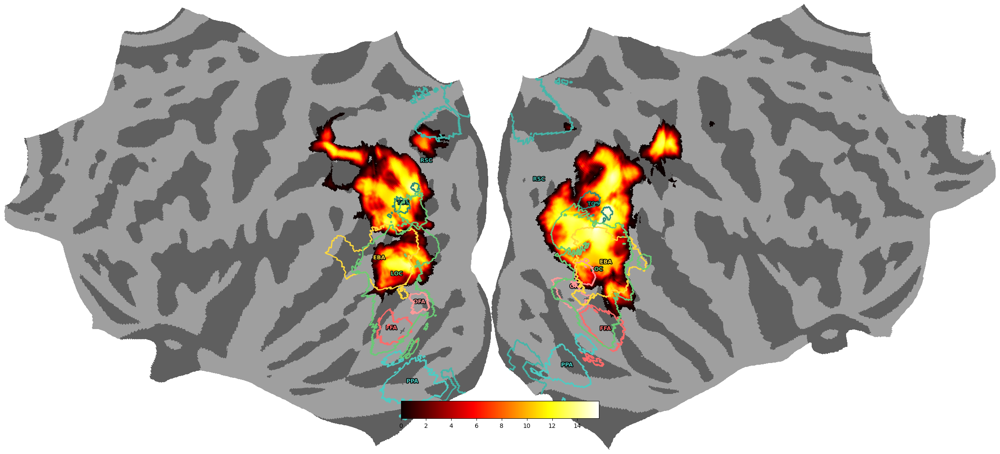

Done!


In [11]:
import cortex
import cortex.database
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from nilearn import surface, datasets
from matplotlib.collections import LineCollection
import matplotlib.patheffects as pe
import os
import glob

cortex.database.db = cortex.database.Database()

# Load tmap
tmap_path = "/mnt/n/Experimental_Data/yujunchen/projects/IAPS_Searchlight/outputs/tBrainmap/final_results/tmap_clipvit_p001_fisherz_fdr01.nii.gz"
fsaverage_ni = datasets.fetch_surf_fsaverage('fsaverage')
texture_l = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_left)
texture_r = surface.vol_to_surf(tmap_path, fsaverage_ni.pial_right)
texture = np.hstack([texture_l, texture_r])
texture[np.abs(texture) < 0.01] = np.nan

vertex_data = cortex.Vertex(texture, 'fsaverage', cmap='hot', vmin=0, vmax=np.nanmax(texture))

fig = cortex.quickflat.make_figure(vertex_data,
                                    with_curvature=True,
                                    with_colorbar=True,
                                    with_rois=False,
                                    with_sulci=False,
                                    with_labels=False,
                                    curvature_brightness=0.5,
                                    curvature_contrast=0.25,
                                    height=1024)

# Get flat surface coordinates
flat_pts, flat_polys = cortex.db.get_surf('fsaverage', 'flat', merge=True, nudge=True)
n_lh = cortex.db.get_surf('fsaverage', 'flat', 'lh')[0].shape[0]

# ---------------------------------------------------------------------------
# Load Julian et al. (2012) parcels from .img files and project to surface
# ---------------------------------------------------------------------------
julian_base = "/mnt/n/Experimental_Data/yujunchen/projects/data/masks/Julian2012"

# Map each parcel file to a display name and color
# Adjust subdirectory names and filenames to match your actual folder structure
julian_parcels = {
    # Face parcels (faces > objects)
    'rFFA':  {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'rFFA.img'),  'color': '#FF6B6B'},
    'lFFA':  {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'lFFA.img'),  'color': '#FF6B6B'},
    'rOFA':  {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'rOFA.img'),  'color': '#FF9999'},
    'lOFA':  {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'lOFA.img'),  'color': '#FF9999'},
    'rpSTS': {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'rpSTS.img'), 'color': '#CC4444'},
    'lpSTS': {'path': os.path.join(julian_base, 'face_parcels', 'face_parcels', 'lpSTS.img'), 'color': '#CC4444'},

    # Scene parcels (scenes > objects)
    'rPPA':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'rPPA.img'),  'color': '#4ECDC4'},
    'lPPA':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'lPPA.img'),  'color': '#4ECDC4'},
    'rRSC':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'rRSC.img'),  'color': '#45B7AA'},
    'lRSC':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'lRSC.img'),  'color': '#45B7AA'},
    'rTOS':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'rTOS.img'),  'color': '#2E8B7A'},
    'lTOS':  {'path': os.path.join(julian_base, 'scene_parcels', 'scene_parcels', 'lTOS.img'),  'color': '#2E8B7A'},

    # Body parcels (bodies > objects)
    'rEBA':  {'path': os.path.join(julian_base, 'body_parcels', 'body_parcels', 'rEBA.img'),  'color': '#FFD93D'},
    'lEBA':  {'path': os.path.join(julian_base, 'body_parcels', 'body_parcels', 'lEBA.img'),  'color': '#FFD93D'},

    # Object parcels (objects > scrambled)
    'rLOC':  {'path': os.path.join(julian_base, 'object_parcels', 'object_parcels', 'rLOC.img'),  'color': '#6BCB77'},
    'lLOC':  {'path': os.path.join(julian_base, 'object_parcels', 'object_parcels', 'lLOC.img'),  'color': '#6BCB77'},
}

# Filter to only parcels that exist on disk
julian_parcels = {k: v for k, v in julian_parcels.items() if os.path.exists(v['path'])}
print(f"Found {len(julian_parcels)} Julian parcels:")
for name in julian_parcels:
    print(f"  {name}: {julian_parcels[name]['path']}")

# Project each volumetric parcel to fsaverage surface and draw boundaries
ax = fig.axes[0]

for roi_name, roi_info in julian_parcels.items():
    parcel_path = roi_info['path']
    roi_color = roi_info['color']

    # Project volume parcel to surface
    try:
        tex_l = surface.vol_to_surf(parcel_path, fsaverage_ni.pial_left,
                                     interpolation='nearest_most_frequent')
        tex_r = surface.vol_to_surf(parcel_path, fsaverage_ni.pial_right,
                                     interpolation='nearest_most_frequent')
    except Exception as e:
        print(f"  Skipping {roi_name}: {e}")
        continue

    # Binarize: vertex is in parcel if projected value > 0
    mask = np.hstack([tex_l, tex_r]) > 0

    if mask.sum() == 0:
        print(f"  {roi_name}: 0 surface vertices, skipping")
        continue

    # Find boundary edges
    boundary_lines = []
    for tri in flat_polys:
        in_roi = mask[tri]
        if 0 < in_roi.sum() < 3:  # boundary triangle
            for i in range(3):
                v1, v2 = tri[i], tri[(i + 1) % 3]
                if mask[v1] != mask[v2]:
                    boundary_lines.append([flat_pts[v1, :2], flat_pts[v2, :2]])

    if boundary_lines:
        lc = LineCollection(boundary_lines, colors=roi_color,
                            linewidths=1.8, alpha=0.9, zorder=5)
        ax.add_collection(lc)

        # Label at centroid of ROI surface vertices
        roi_pts = flat_pts[mask]
        cx, cy = roi_pts[:, 0].mean(), roi_pts[:, 1].mean()

        # Clean display name: remove l/r prefix, show hemisphere as subscript-style
        hemi = 'L' if roi_name.startswith('l') else 'R'
        clean_name = roi_name[1:]  # remove l/r prefix
        label_text = f"{clean_name}"

        ax.text(cx, cy, label_text, color=roi_color, fontsize=9, fontweight='bold',
                ha='center', va='center',
                path_effects=[pe.withStroke(linewidth=2.5, foreground='black')])
        print(f"  Added {roi_name} ({mask.sum()} vertices)")
    else:
        print(f"  {roi_name}: no boundary lines found")

fig.savefig('/tmp/tmap_flatmap_julian_rois.png', dpi=300, bbox_inches='tight')
plt.show()
print("Done!")